### Import

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.ticker import FixedLocator, MaxNLocator

%matplotlib inline

sns.set_style('whitegrid')
plt.rcParams['font.size'] = 15
plt.rcParams['figure.figsize'] =(10, 7)
plt.rcParams['figure.facecolor'] = '#FFE5B4'

In [2]:
pd.set_option('display.max_rows', None)

In [3]:
# Import Data

%store -r happiness_all_years
%store -r country_ids

In [4]:
# Create duplicates

data = happiness_all_years
country_ids = country_ids

In [5]:
data.sample(10)

,country_name,country_id,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
2010,Switzerland,119,Europe,2017,7.473593,11.143362,0.949661,72.099998,0.924997,0.173113,0.316183
1682,Philippines,102,Asia & Pacific,2021,5.965058,8.998964,0.778192,62.049999,0.905275,-0.008972,0.721162
1969,Sri Lanka,117,Asia & Pacific,2011,4.180569,9.229197,0.841938,64.680000,0.822637,0.139286,0.760301
1540,Niger,94,Africa,2009,4.267170,6.887199,0.771265,51.459999,0.880042,-0.008824,0.483153
1514,New Zealand,92,Asia & Pacific,2019,7.205174,10.671519,0.938821,70.199997,0.912042,0.152175,0.233831
950,Iraq,57,Middle east,2011,4.725366,9.047008,0.750749,60.880001,0.347414,-0.064874,0.780027
899,India,54,Asia & Pacific,2010,4.989277,8.346016,0.604810,57.299999,0.783060,0.055902,0.862548
1767,Rwanda,156,Africa,2018,3.561047,7.625810,0.616173,59.875000,0.924232,0.056681,0.163810
1694,Poland,103,Europe,2017,6.201268,10.307556,0.881854,68.349998,0.830843,-0.125196,0.639480
713,Gabon,42,Africa,2017,4.782383,9.580395,0.806941,56.950001,0.652360,-0.228761,0.868306


### Data All Years Analysis

In [6]:
test_data = data

In [7]:
print(test_data.shape)
test_data.describe()

(2356, 11)


,country_id,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
count,2356.000000,2356.000000,2356.000000,2316.000000,2343.000000,2332.000000,2323.000000,2263.000000,2240.000000
mean,75.963073,2014.644312,5.477906,9.393316,0.810085,63.770831,0.750603,0.001449,0.741070
std,44.261363,5.021733,1.122751,1.156463,0.120990,7.194730,0.138477,0.160037,0.187148
min,1.000000,2005.000000,1.281271,5.526723,0.228217,6.720000,0.257534,-0.337527,0.035198
25%,37.000000,2011.000000,4.653012,8.502017,0.746513,59.480000,0.660898,-0.108697,0.682714
50%,75.000000,2015.000000,5.431223,9.502519,0.834509,65.255001,0.771577,-0.020794,0.797438
75%,113.000000,2019.000000,6.307544,10.380333,0.904432,69.000000,0.859254,0.095138,0.867182
max,165.000000,2023.000000,8.018934,11.663788,0.987343,85.497561,0.985178,0.702708,0.983276


In [8]:
# Number of reports over time

n_reports_year = test_data.groupby('year')['happiness_score'].count().reset_index().rename(columns = {'happiness_score':'n_reports'}).sort_values('year', ascending=False).reset_index().drop('index', axis=1)
n_reports_year

,year,n_reports
0,2023,137
1,2022,114
2,2021,122
3,2020,116
4,2019,143
5,2018,141
6,2017,147
7,2016,141
8,2015,142
9,2014,144


In [9]:
n_reports_year.sort_values('n_reports', ascending= False)

,year,n_reports
12,2011,151
6,2017,147
11,2012,146
9,2014,144
4,2019,143
8,2015,142
5,2018,141
7,2016,141
0,2023,137
10,2013,136


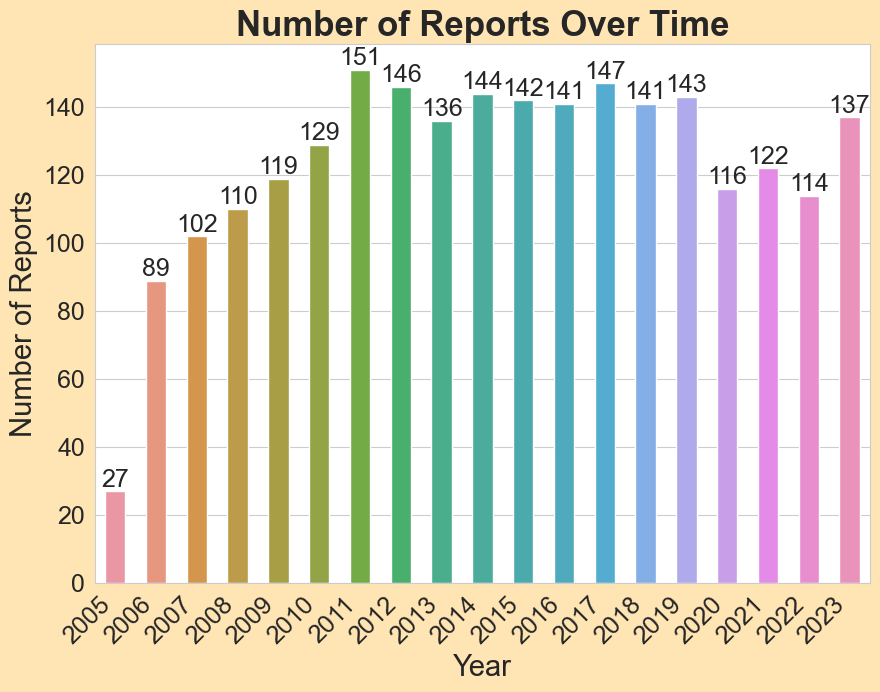

In [10]:
ax = sns.barplot(data=n_reports_year, x='year', y='n_reports', width=0.5)

ax.set_title('Number of Reports Over Time',fontweight="bold", size=25)
ax.set_xlabel('Year', size=21)
ax.set_ylabel('Number of Reports', size=21)
ax.tick_params(labelsize=18)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')
ax.bar_label(ax.containers[0], size=18)

plt.show()

In [11]:
# Average between 2011 and 2019

n_reports_year[(n_reports_year['year'] > 2010) & (n_reports_year['year'] < 2020)]['n_reports'].mean()

143.44444444444446

In [12]:
# Total number of countries representing in dataset

test_data['country_name'].drop_duplicates().count()

165

In [13]:
n_reports_country = test_data.groupby('country_name')['happiness_score'].count().sort_values(ascending=False).reset_index().rename(columns = {'happiness_score':'n_reports'})
n_reports_country.head(10)

,country_name,n_reports
0,Somaliland,24
1,Lebanon,18
2,Mexico,18
3,Kyrgyzstan,18
4,Kenya,18
5,Kazakhstan,18
6,Jordan,18
7,Japan,18
8,Italy,18
9,Israel,18


In [14]:
n_reports_n_countries = n_reports_country.groupby('n_reports')['country_name'].count().sort_values(ascending=False).reset_index().rename(columns = {'country_name':'n_countries'})
n_reports_n_countries

,n_reports,n_countries
0,18,50
1,17,25
2,16,19
3,15,14
4,11,9
5,13,8
6,14,7
7,5,6
8,1,5
9,12,5


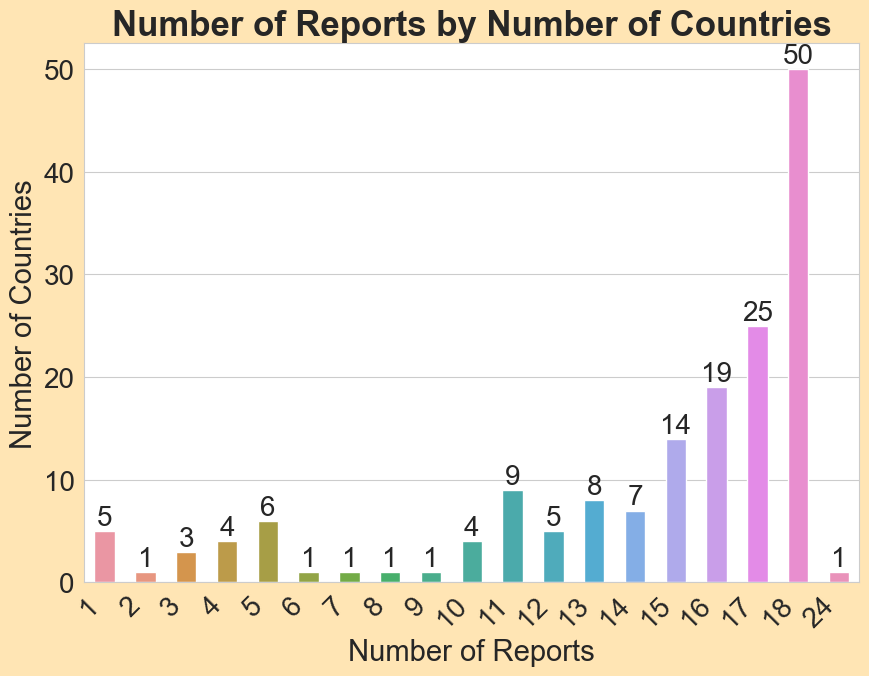

In [15]:
ax = sns.barplot(data=n_reports_n_countries, x='n_reports', y='n_countries', width=0.5)

ax.set_title('Number of Reports by Number of Countries',fontweight="bold", size=25)
ax.set_xlabel('Number of Reports', size=21)
ax.set_ylabel('Number of Countries', size=21)
ax.tick_params(labelsize=20)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')
ax.bar_label(ax.containers[0], size=20)

plt.show()

In [16]:
test_data.groupby('country_name')['happiness_score'].mean().sort_values(ascending=False).reset_index().head(10)

,country_name,happiness_score
0,Denmark,7.668593
1,Finland,7.630711
2,Norway,7.469026
3,Iceland,7.465061
4,Switzerland,7.456454
5,Netherlands,7.449111
6,Sweden,7.378256
7,Canada,7.303492
8,Israel,7.277166
9,New Zealand,7.269344


In [17]:
test_data.groupby('year')['happiness_score'].mean().sort_values(ascending=False).reset_index()

,year,happiness_score
0,2005,6.446164
1,2020,5.727539
2,2021,5.636193
3,2022,5.585126
4,2019,5.570995
5,2023,5.539755
6,2018,5.498683
7,2010,5.464247
8,2017,5.460421
9,2009,5.438050


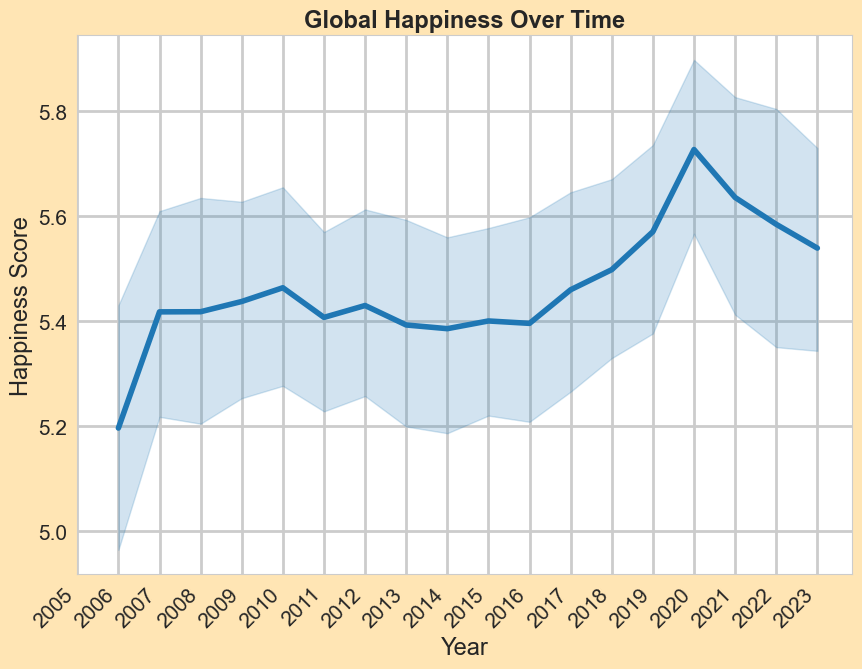

In [18]:
# Change of world happiness over time

year_labels = test_data['year'].drop_duplicates().sort_values(ascending=True).tolist()

ax = sns.lineplot(data=test_data[test_data['year'] >= 2006], x='year',y='happiness_score', linewidth=4.0)

ax.set_title('Global Happiness Over Time',fontweight="bold", size=17)
ax.set_xlabel('Year', size=17)
ax.set_ylabel('Happiness Score', size=17)
ax.set_xticks(year_labels)
ax.tick_params(labelsize=15)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')
ax.grid(linewidth=2)

In [19]:
legend=['Europe','Africa','Asia & Pacific','South/Latin America','Middle east','Arab States','North America','South/Central America']
legend

['Europe',
 'Africa',
 'Asia & Pacific',
 'South/Latin America',
 'Middle east',
 'Arab States',
 'North America',
 'South/Central America']

In [20]:
year_labels = test_data['year'].drop_duplicates().sort_values(ascending=True).tolist()
year_labels

[2005,
 2006,
 2007,
 2008,
 2009,
 2010,
 2011,
 2012,
 2013,
 2014,
 2015,
 2016,
 2017,
 2018,
 2019,
 2020,
 2021,
 2022,
 2023]

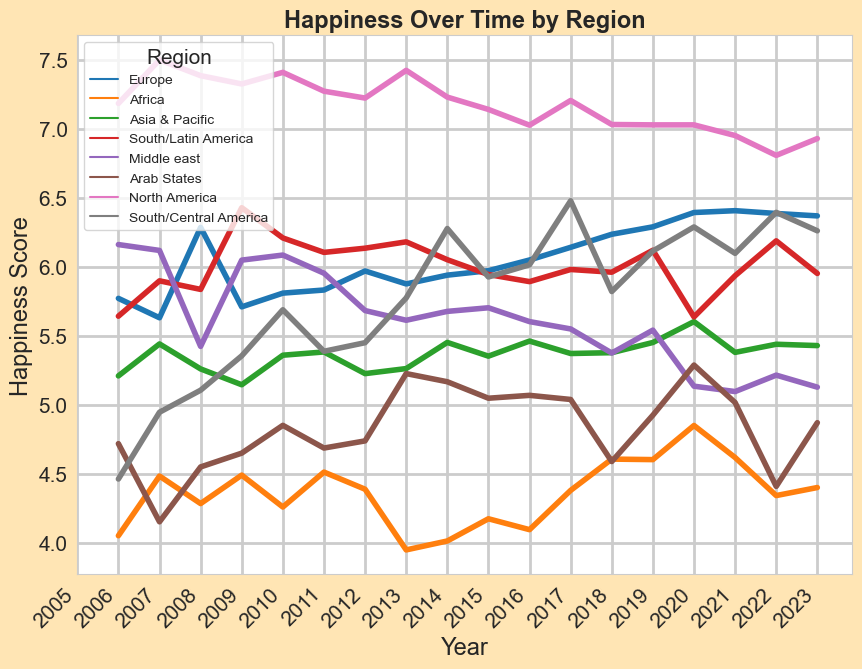

In [21]:
# Change of world happiness over time

ax = sns.lineplot(data=test_data[test_data['year'] >= 2006], x='year',y='happiness_score', linewidth=4.0, hue='region', hue_order=legend, errorbar=None)

ax.set_title('Happiness Over Time by Region',fontweight="bold", size=17)
ax.legend(title='Region',loc='upper left', fontsize='10')
ax.set_xlabel('Year', size=17)
ax.set_ylabel('Happiness Score', size=17)
ax.set_xticks(year_labels)
ax.tick_params(labelsize=15)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')
ax.grid(linewidth=2)

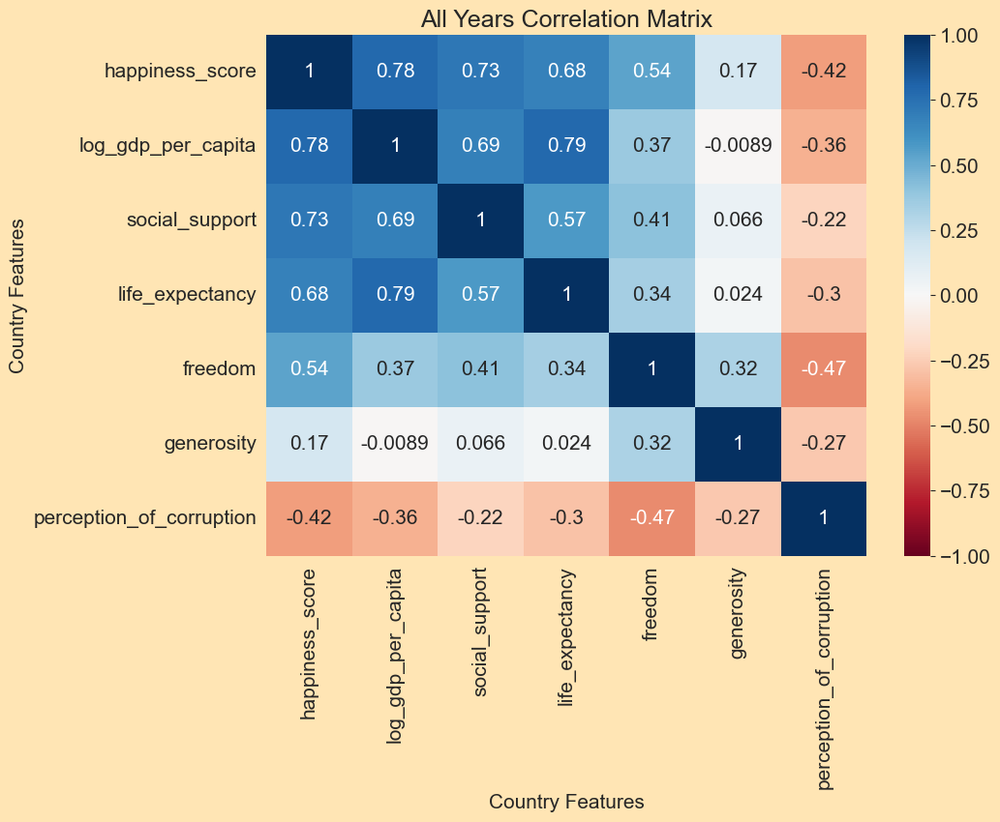

In [22]:
corr_matrix = test_data.drop(['year', 'country_id'], axis=1).corr(numeric_only = True, method = "pearson")

sns.heatmap(corr_matrix, annot=True, cmap='RdBu', vmin=-1, vmax=1)

plt.title('All Years Correlation Matrix')
plt.xlabel('Country Features')
plt.ylabel('Country Features')

plt.show()

# Shows that Country Features with the highest correlation to happiness are: log_gdp_per_capita, healthy_life_expectancy, and social_support

Text(0, 0.5, 'Social Support')

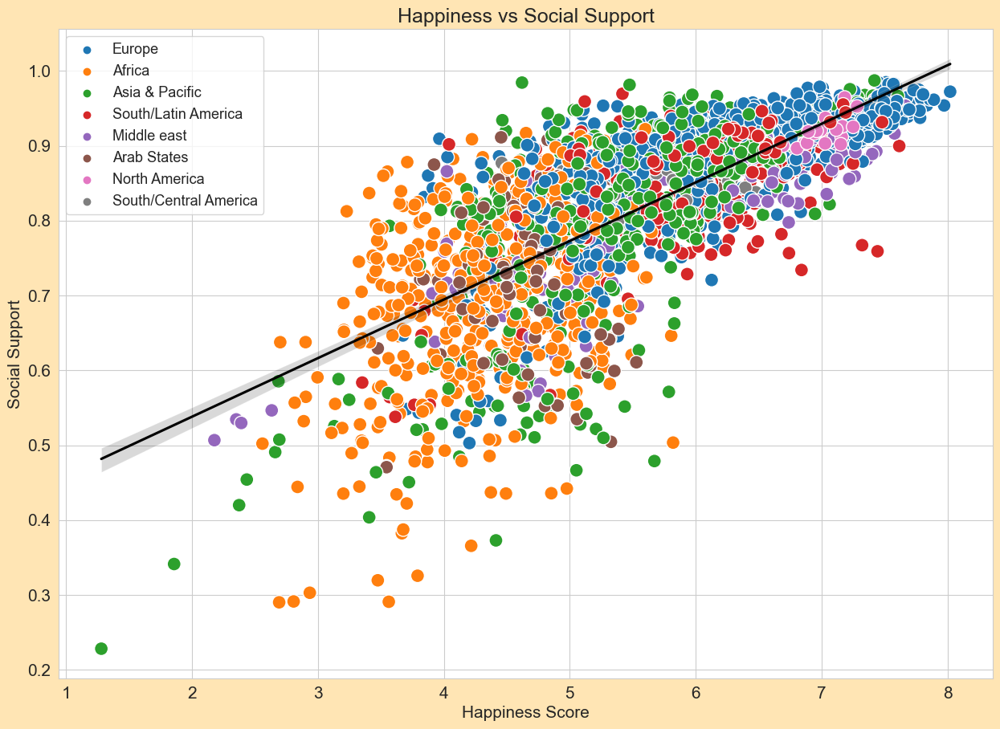

In [23]:
# Plot happiness_score and social_support

plt.rcParams['figure.figsize'] = (15,10.5)
plt.title('Happiness vs Social Support')
ax = happ_gdp_corr = sns.scatterplot(x = test_data.happiness_score,
                                     y = test_data.social_support, 
                                     hue_order = legend, 
                                     hue = data['region'], 
                                     s = 150)
sns.regplot(data=test_data, 
            x="happiness_score",
            y="social_support",
            scatter=False, 
            line_kws={"color": "black"}, 
            ax=ax)

plt.legend(loc = 'upper left',
           fontsize = '13')
plt.xlabel('Happiness Score')
plt.ylabel('Social Support')

Text(0, 0.5, 'Log GDP per Capita')

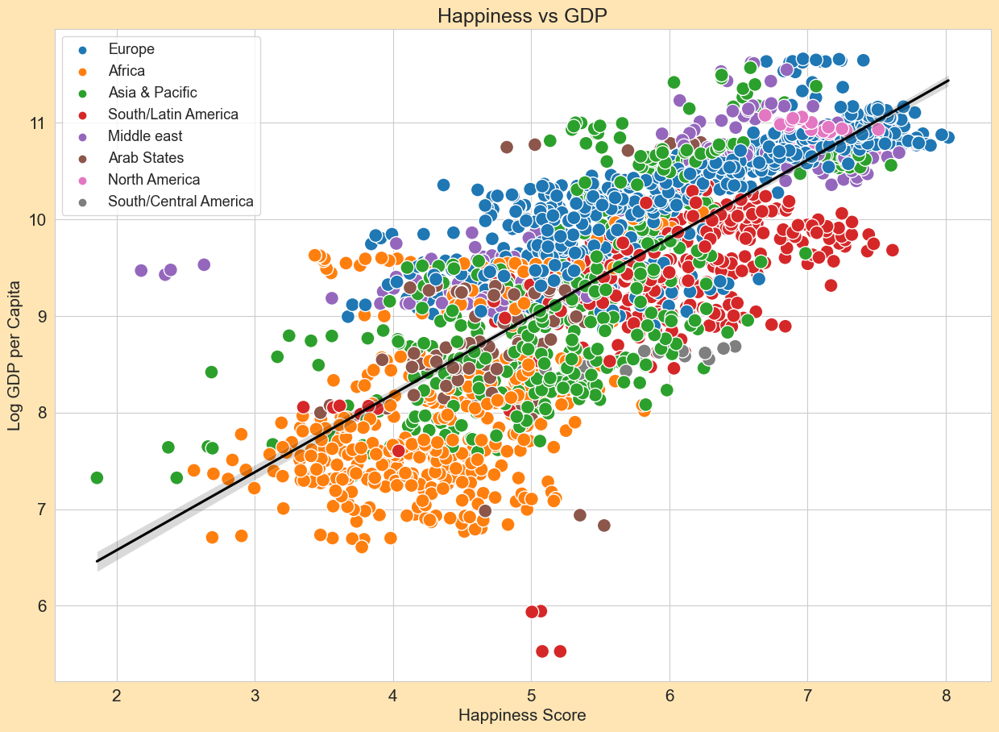

In [24]:
# Plot happiness_score and log_gdp_per_capita

plt.rcParams['figure.figsize'] = (15,10.5)
plt.title('Happiness vs GDP')
ax = happ_gdp_corr = sns.scatterplot(x = test_data.happiness_score,
                                     y = test_data.log_gdp_per_capita, 
                                     hue_order = legend, 
                                     hue = data['region'], 
                                     s = 150)
sns.regplot(data=test_data, 
            x="happiness_score",
            y="log_gdp_per_capita",
            scatter=False, 
            line_kws={"color": "black"}, 
            ax=ax)

plt.legend(loc = 'upper left',
           fontsize = '13')
plt.xlabel('Happiness Score')
plt.ylabel('Log GDP per Capita')

In [25]:
test_data.sort_values('life_expectancy').head(10)

,country_name,country_id,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
826,Haiti,149,South/Latin America,2006,3.754156,7.972617,0.693801,6.720000,0.449475,0.358533,0.853506
827,Haiti,149,South/Latin America,2008,3.846329,8.012043,0.679098,17.360001,0.464971,0.216526,0.811659
828,Haiti,149,South/Latin America,2010,3.765999,7.983535,0.554031,28.000000,0.372941,0.170872,0.848007
829,Haiti,149,South/Latin America,2011,4.844574,8.022003,0.567039,33.320000,0.412588,0.197880,0.681960
830,Haiti,149,South/Latin America,2012,4.413475,8.011640,0.748663,38.639999,0.482486,0.246083,0.717166
2338,Zimbabwe,137,NaN,2006,3.826268,7.459545,0.821656,40.400002,0.431110,-0.059926,0.904757
364,Central African Republic,144,Africa,2007,4.160130,6.945774,0.532297,41.480000,0.662871,0.082950,0.782131
1188,Lesotho,151,Africa,2011,4.897515,7.785040,0.824085,41.520000,0.618260,-0.089229,0.767676
2339,Zimbabwe,137,NaN,2007,3.280247,7.412637,0.828113,41.599998,0.455957,-0.065477,0.946287
1189,Lesotho,151,Africa,2016,3.808205,7.896603,0.798059,42.250000,0.729490,-0.096638,0.742873


Text(0, 0.5, 'Life Expectancy')

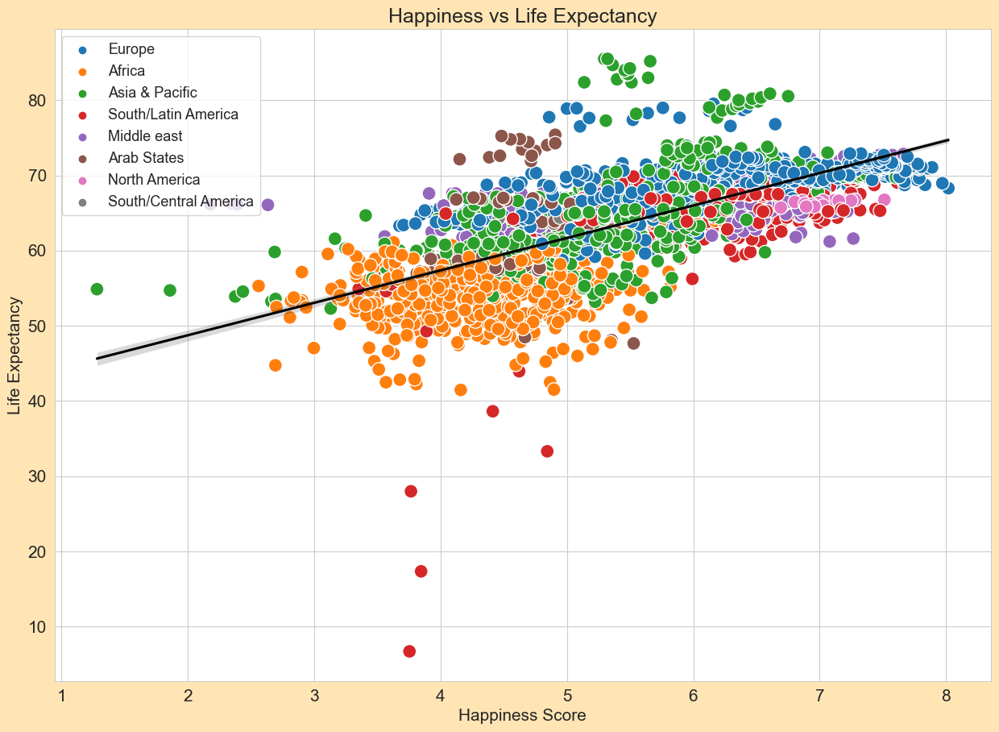

In [26]:
# Plot happiness_score and life_expectancy

plt.rcParams['figure.figsize'] = (15,10.5)
plt.title('Happiness vs Life Expectancy')
ax = happ_gdp_corr = sns.scatterplot(x = test_data.happiness_score,
                                     y = test_data.life_expectancy, 
                                     hue_order = legend, 
                                     hue = data['region'], 
                                     s = 150)
sns.regplot(data=test_data, 
            x="happiness_score",
            y="life_expectancy",
            scatter=False, 
            line_kws={"color": "black"}, 
            ax=ax)

plt.legend(loc = 'upper left',
           fontsize = '13')
plt.xlabel('Happiness Score')
plt.ylabel('Life Expectancy')

Text(0, 0.5, 'Freedom')

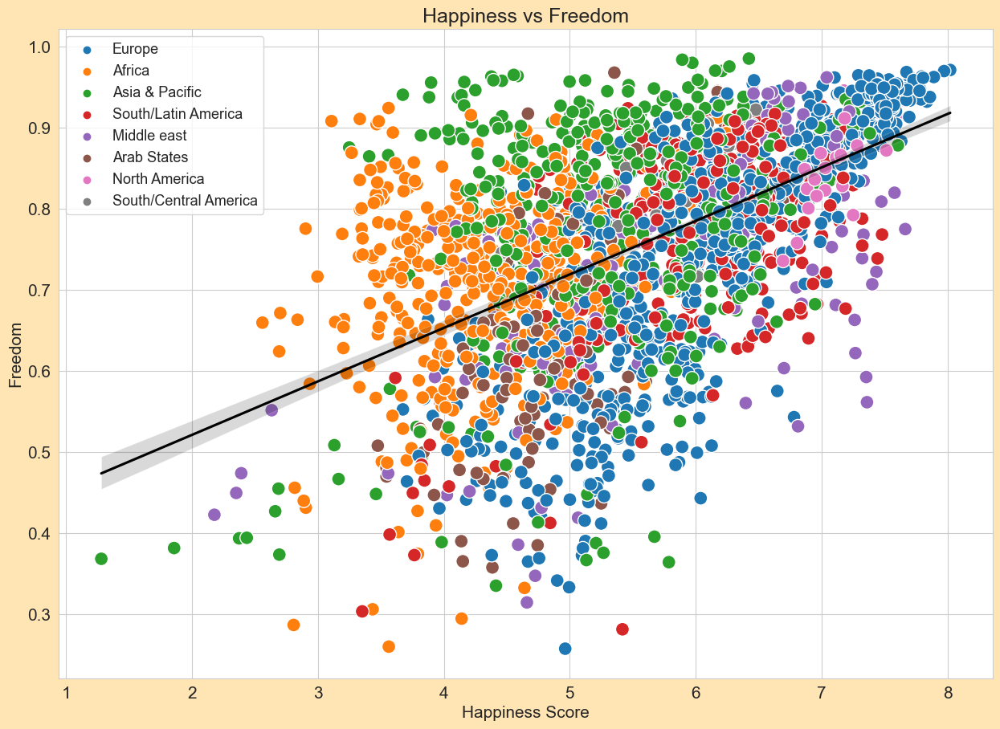

In [27]:
# Plot happiness_score and freedom

plt.rcParams['figure.figsize'] = (15,10.5)
plt.title('Happiness vs Freedom')
ax = happ_gdp_corr = sns.scatterplot(x = test_data.happiness_score,
                                     y = test_data.freedom, 
                                     hue_order = legend, 
                                     hue = data['region'], 
                                     s = 150)
sns.regplot(data=test_data, 
            x="happiness_score",
            y="freedom",
            scatter=False, 
            line_kws={"color": "black"}, 
            ax=ax)

plt.legend(loc = 'upper left',
           fontsize = '13')
plt.xlabel('Happiness Score')
plt.ylabel('Freedom')

Text(0, 0.5, 'Generosity')

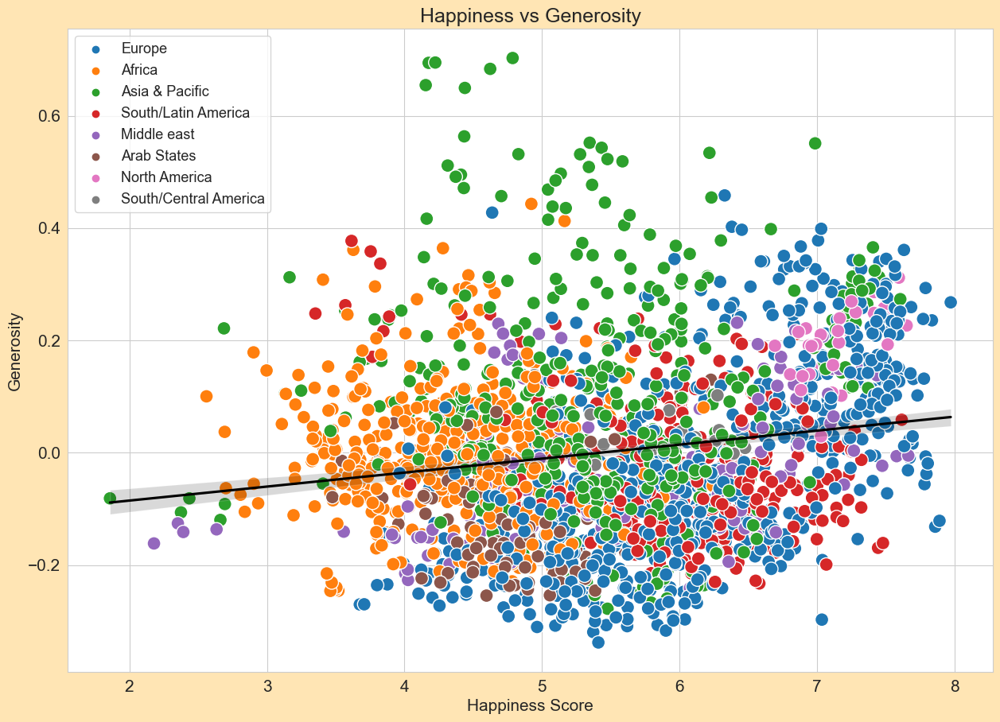

In [28]:
# Plot happiness_score and generosity

plt.rcParams['figure.figsize'] = (15,10.5)
plt.title('Happiness vs Generosity')
ax = happ_gdp_corr = sns.scatterplot(x = test_data.happiness_score,
                                     y = test_data.generosity, 
                                     hue_order = legend, 
                                     hue = data['region'], 
                                     s = 150)
sns.regplot(data=test_data, 
            x="happiness_score",
            y="generosity",
            scatter=False, 
            line_kws={"color": "black"}, 
            ax=ax)

plt.legend(loc = 'upper left',
           fontsize = '13')
plt.xlabel('Happiness Score')
plt.ylabel('Generosity')

Text(0, 0.5, 'Perception of Corruption')

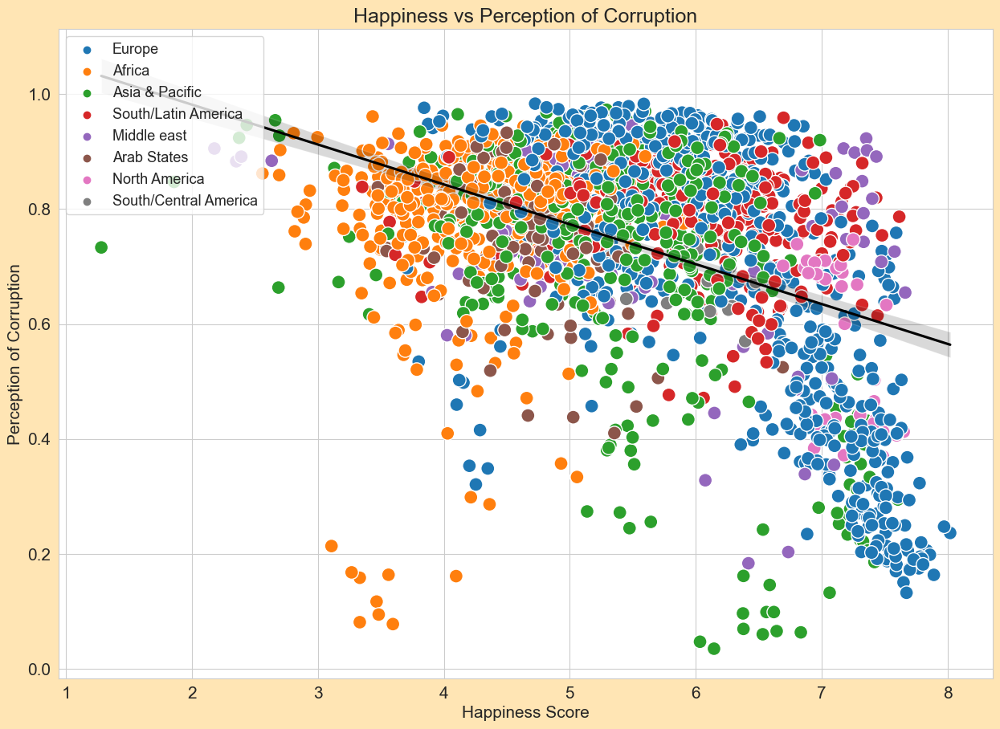

In [29]:
# Plot happiness_score and perception_of_corruption

plt.rcParams['figure.figsize'] = (15,10.5)
plt.title('Happiness vs Perception of Corruption')
ax = happ_gdp_corr = sns.scatterplot(x = test_data.happiness_score,
                                     y = test_data.perception_of_corruption, 
                                     hue_order = ['Europe',
                                                  'Africa',
                                                  'Asia & Pacific',
                                                  'South/Latin America',
                                                  'Middle east',
                                                  'Arab States',
                                                  'North America',
                                                  'South/Central America'], 
                                     hue = data['region'], 
                                     s = 150)
sns.regplot(data=test_data, 
            x="happiness_score",
            y="perception_of_corruption",
            scatter=False, 
            line_kws={"color": "black"}, 
            ax=ax)

plt.legend(loc = 'upper left',
           fontsize = '13')
plt.xlabel('Happiness Score')
plt.ylabel('Perception of Corruption')

Text(0, 0.5, 'Log GDP per Capita')

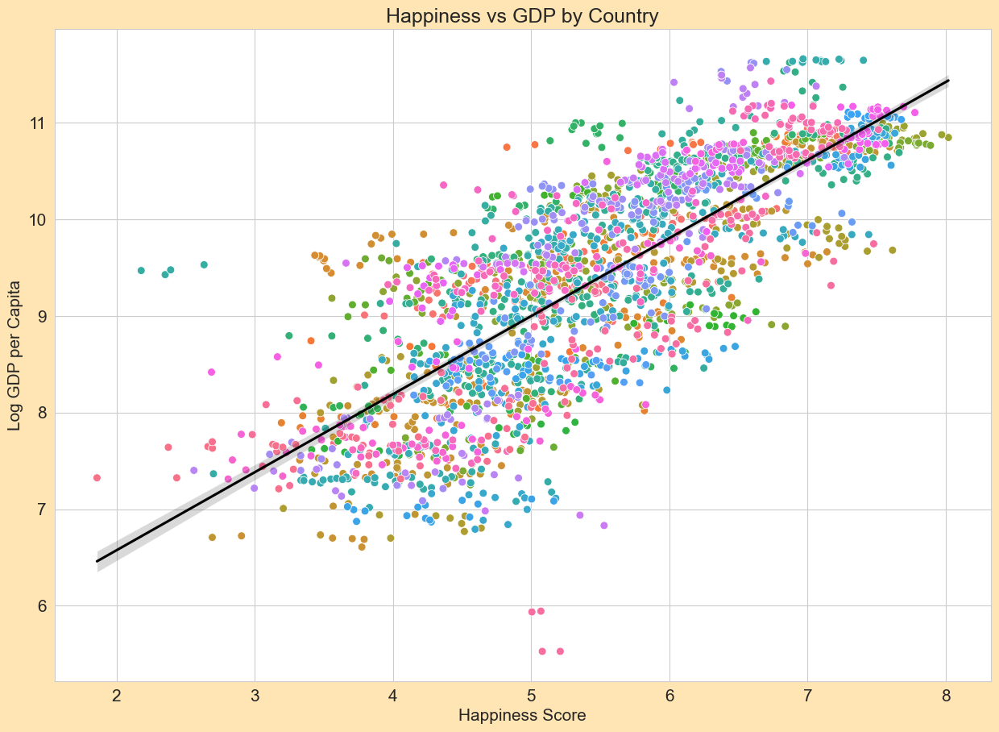

In [30]:
# Plot happiness_score and log_gdp_per_capita

plt.rcParams['figure.figsize'] = (15,10.5)
plt.title('Happiness vs GDP by Country')
ax = happ_gdp_corr = sns.scatterplot(x = test_data.happiness_score,
                                     y = test_data.log_gdp_per_capita,
                                     hue = data['country_name'], 
                                     s = 50)
sns.regplot(data=test_data, 
            x="happiness_score",
            y="log_gdp_per_capita",
            scatter=False, 
            line_kws={"color": "black"}, 
            ax=ax)

ax.get_legend().remove()
plt.xlabel('Happiness Score')
plt.ylabel('Log GDP per Capita')

In [31]:
# Find variation in happiness by country
# How does this difference in variation affect correlated country features? Do more happiness stable countries differ from happines unstable countries?

In [32]:
test_data_pivot = pd.pivot_table(test_data, index='year', columns='country_name', values='happiness_score').reset_index()
test_data_pivot = test_data_pivot.drop(index=0)

In [33]:
test_data_pivot.head(20)

country_name,year,Afghanistan,Albania,Algeria,Angola,Argentina,Armenia,Australia,Austria,Azerbaijan,...,United Arab Emirates,United Kingdom,United States,Uruguay,Uzbekistan,Venezuela,Vietnam,Yemen,Zambia,Zimbabwe
1,2006,NaN,NaN,NaN,NaN,6.312925,4.289311,NaN,7.122211,4.727871,...,6.734222,NaN,7.181794,5.785868,5.232322,6.525146,5.293660,NaN,4.824455,3.826268
2,2007,NaN,4.634252,NaN,NaN,6.073158,4.881516,7.285391,NaN,4.568160,...,NaN,6.801931,7.512688,5.693946,NaN,NaN,5.421688,4.477133,3.998293,3.280247
3,2008,3.723590,NaN,NaN,NaN,5.961034,4.651972,7.253757,7.180954,4.817189,...,NaN,6.986464,7.280386,5.663870,5.311368,6.257771,5.480425,NaN,4.730263,3.174264
4,2009,4.401778,5.485470,NaN,NaN,6.424133,4.177582,NaN,NaN,4.573725,...,6.866063,6.906547,7.158032,6.296223,5.260721,7.188803,5.304265,4.809259,5.260361,4.055914
5,2010,4.758381,5.268937,5.463567,NaN,6.441067,4.367811,7.450047,7.302679,4.218611,...,7.097456,7.029364,7.163616,6.062011,5.095342,7.478455,5.295781,4.350313,NaN,4.681570
6,2011,3.831719,5.867422,5.317194,5.589001,6.775805,4.260491,7.405616,7.470513,4.680470,...,7.118701,6.869249,7.115139,6.554047,5.738744,6.579789,5.767344,3.746256,4.999114,4.845642
7,2012,3.782938,5.510124,5.604596,4.360250,6.468387,4.319712,7.195586,7.400689,4.910772,...,7.217767,6.880784,7.026227,6.449728,6.019332,7.066577,5.534570,4.060601,5.013375,4.955101
8,2013,3.572100,4.550648,NaN,3.937107,6.582260,4.277191,7.364169,7.498803,5.481178,...,6.620951,6.918055,7.249285,6.444465,5.939986,6.552796,5.022699,4.217679,5.243996,4.690188
9,2014,3.130896,4.813763,6.354898,3.794838,6.671114,4.453083,7.288550,6.950000,5.251530,...,6.539855,6.758148,7.151114,6.561444,6.049212,6.136096,5.084923,3.967958,4.345837,4.184451
10,2015,3.982855,4.606651,NaN,NaN,6.697131,4.348320,7.309061,7.076447,5.146775,...,6.568398,6.515445,6.863947,6.628080,5.972364,5.568800,5.076315,2.982674,4.843164,3.703191


In [34]:
happiness_variation = test_data_pivot.drop('year', axis=1).var().sort_values().reset_index().rename(columns = {0:'variation'})
happiness_variation.head(20)

,country_name,variation
0,Netherlands,0.007962
1,Sweden,0.009218
2,Australia,0.012868
3,Belgium,0.015915
4,Denmark,0.017516
5,Norway,0.018259
6,New Zealand,0.018970
7,Japan,0.019681
8,Hong Kong,0.020887
9,Libya,0.024064


In [35]:
happiness_variation.describe()

,variation
count,160.000000
mean,0.186051
std,0.192392
min,0.007962
25%,0.064822
50%,0.131135
75%,0.239333
max,1.356672


In [36]:
happiness_variation[happiness_variation['variation'] <= 0.064822].head(20)

,country_name,variation
0,Netherlands,0.007962
1,Sweden,0.009218
2,Australia,0.012868
3,Belgium,0.015915
4,Denmark,0.017516
5,Norway,0.018259
6,New Zealand,0.018970
7,Japan,0.019681
8,Hong Kong,0.020887
9,Libya,0.024064


In [37]:
happiness_variation[happiness_variation['variation'] >= 0.239333].head(20)

,country_name,variation
120,Burkina Faso,0.241351
121,Pakistan,0.246703
122,Turkmenistan,0.255762
123,Ghana,0.258218
124,Nepal,0.263089
125,Greece,0.271997
126,Honduras,0.276167
127,Central African Republic,0.280654
128,Lithuania,0.281360
129,Congo Kinshasa,0.287386


In [38]:
lowest_25perc_variation_countries = happiness_variation[happiness_variation['variation'] <= 0.064822]['country_name'].tolist()
highest_25perc_variation_countries = happiness_variation[happiness_variation['variation'] >= 0.239333]['country_name'].tolist()

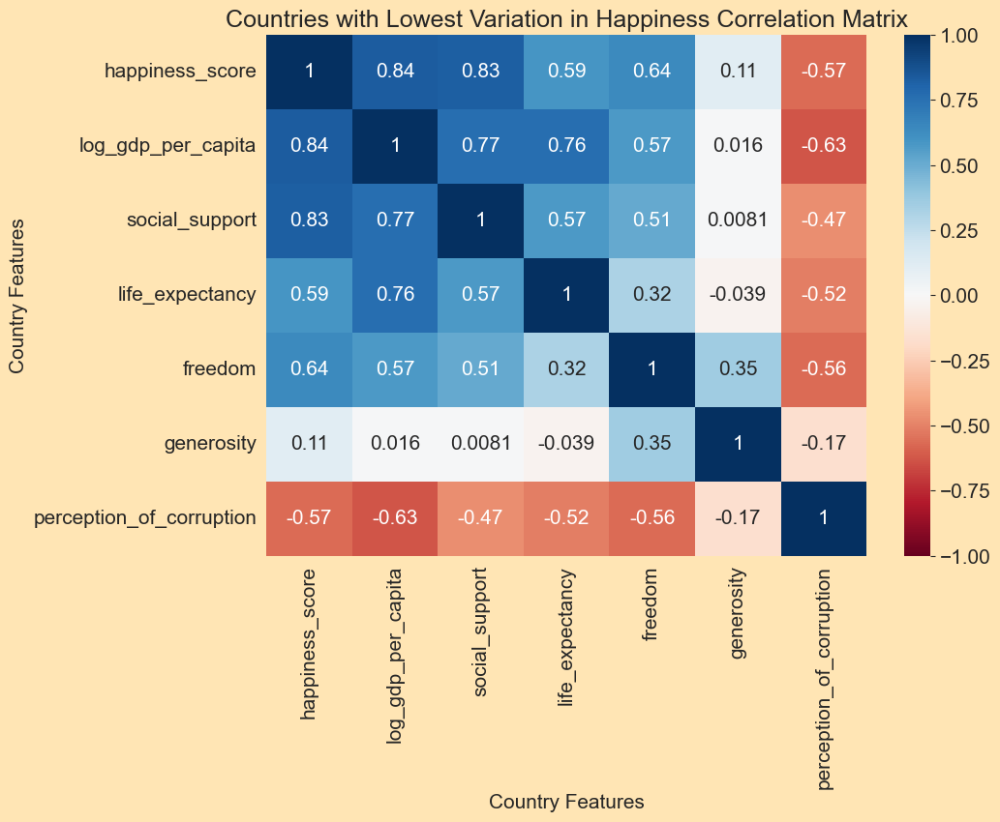

In [39]:
plt.rcParams['figure.figsize'] =(10, 7)

corr_matrix_lowest_variation = test_data.drop(['year', 'country_id'], axis=1)[test_data['country_name'].isin(lowest_25perc_variation_countries)].corr(numeric_only = True, method = "pearson")
sns.heatmap(corr_matrix_lowest_variation, annot=True, cmap="RdBu", vmin=-1, vmax=1)

plt.rcParams['figure.figsize'] =(10, 7)
plt.title('Countries with Lowest Variation in Happiness Correlation Matrix')
plt.xlabel('Country Features')
plt.ylabel('Country Features')

plt.show()

# Shows that Country Features with the highest correlation to happiness are: log_gdp_per_capita, healthy_life_expectancy, and social_support

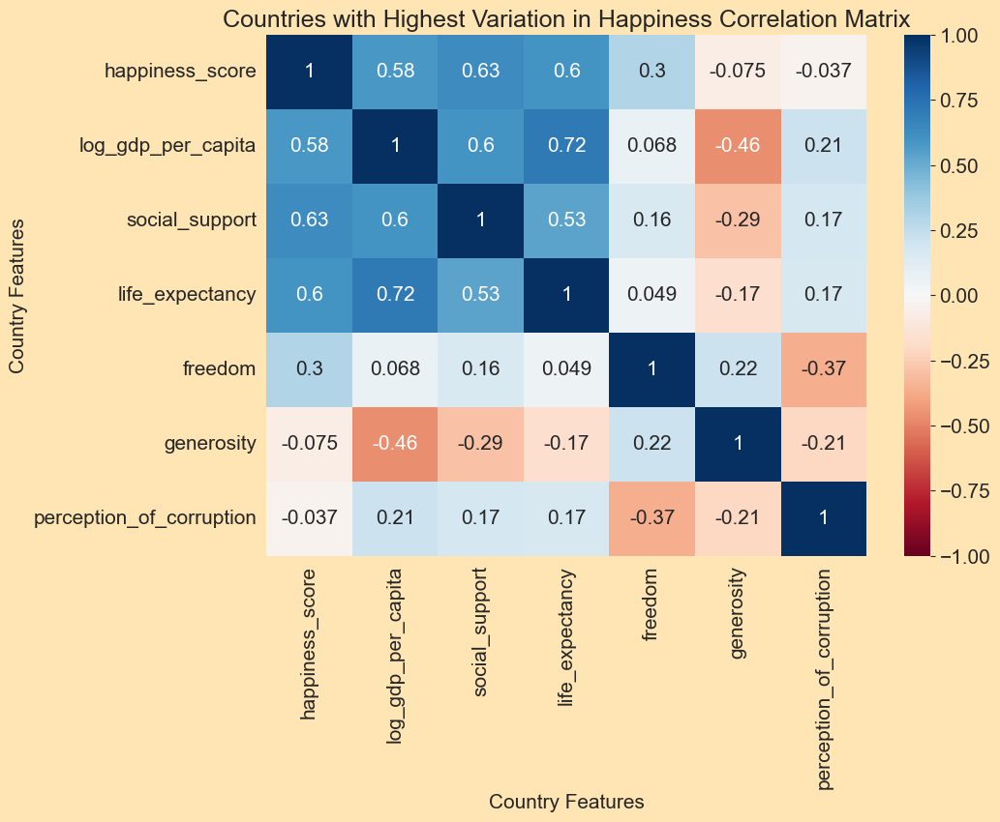

In [40]:
plt.rcParams['figure.figsize'] =(10, 7)

corr_matrix_highest_variation = test_data.drop(['year', 'country_id'], axis=1)[test_data['country_name'].isin(highest_25perc_variation_countries)].corr(numeric_only = True, method = "pearson")
sns.heatmap(corr_matrix_highest_variation, annot=True, cmap="RdBu", vmin=-1, vmax=1)

plt.title('Countries with Highest Variation in Happiness Correlation Matrix')
plt.xlabel('Country Features')
plt.ylabel('Country Features')

plt.show()

# Shows that Country Features with the highest correlation to happiness are: log_gdp_per_capita, healthy_life_expectancy, and social_support

In [41]:
low_var_happiness_corr = corr_matrix_lowest_variation['happiness_score'].reset_index().rename(columns = {'index':'country_feature','happiness_score':'low_var_happiness_corr'})
low_var_happiness_corr

,country_feature,low_var_happiness_corr
0,happiness_score,1.000000
1,log_gdp_per_capita,0.835829
2,social_support,0.826576
3,life_expectancy,0.588003
4,freedom,0.640157
5,generosity,0.111763
6,perception_of_corruption,-0.565378


In [42]:
high_var_happiness_corr = corr_matrix_highest_variation['happiness_score'].reset_index().rename(columns = {'index':'country_feature','happiness_score':'high_var_happiness_corr'})
high_var_happiness_corr

,country_feature,high_var_happiness_corr
0,happiness_score,1.000000
1,log_gdp_per_capita,0.579930
2,social_support,0.630160
3,life_expectancy,0.598619
4,freedom,0.302479
5,generosity,-0.075408
6,perception_of_corruption,-0.036867


In [43]:
variation_diff = low_var_happiness_corr.merge(high_var_happiness_corr, on='country_feature')
variation_diff['diff'] = abs(variation_diff['low_var_happiness_corr'] -variation_diff['high_var_happiness_corr'])
variation_diff.sort_values('diff', ascending=False).reset_index().drop('index', axis=1)

,country_feature,low_var_happiness_corr,high_var_happiness_corr,diff
0,perception_of_corruption,-0.565378,-0.036867,0.528511
1,freedom,0.640157,0.302479,0.337678
2,log_gdp_per_capita,0.835829,0.579930,0.255899
3,social_support,0.826576,0.630160,0.196416
4,generosity,0.111763,-0.075408,0.187171
5,life_expectancy,0.588003,0.598619,0.010616
6,happiness_score,1.000000,1.000000,0.000000


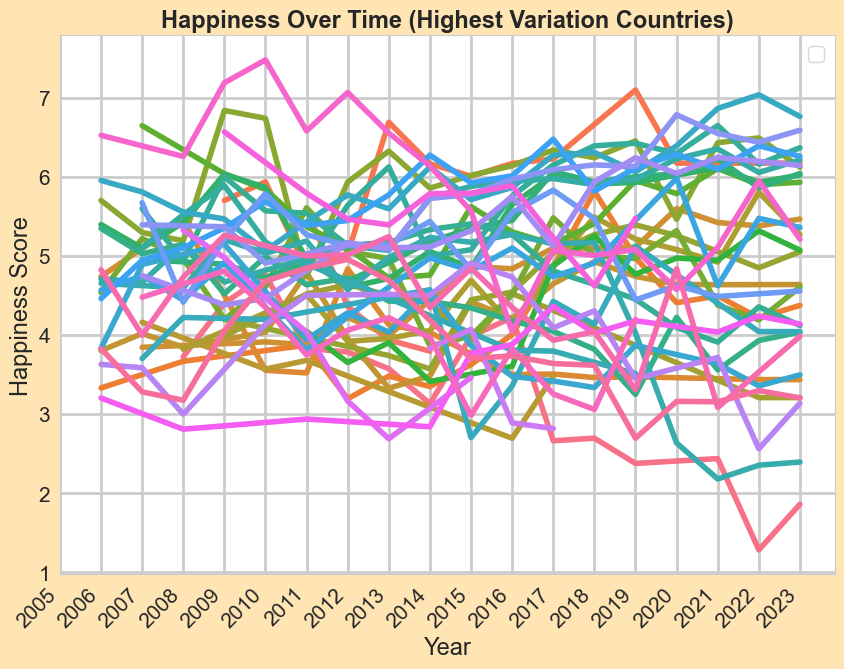

In [44]:
# Change of world happiness over time

ax = sns.lineplot(data=test_data[(test_data['year'] >= 2006) & (test_data['country_name'].isin(highest_25perc_variation_countries))], x='year',y='happiness_score', linewidth=4.0, hue='country_name', errorbar=None)

ax.set_title('Happiness Over Time (Highest Variation Countries)',fontweight="bold", size=17)
ax.legend([])
ax.set_xlabel('Year', size=17)
ax.set_ylabel('Happiness Score', size=17)
ax.set_xticks(year_labels)
ax.tick_params(labelsize=15)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')
ax.grid(linewidth=2)

In [45]:
# Countries with highest variation in happiness avg happiness over time
test_data[(test_data['year'] >= 2006) & (test_data['country_name'].isin(highest_25perc_variation_countries))].groupby('year')['happiness_score'].mean().reset_index().rename(columns={'happiness_score':'avg_happiness_score'})

,year,avg_happiness_score
0,2006,4.612863
1,2007,4.786665
2,2008,4.601964
3,2009,5.232447
4,2010,4.958243
5,2011,4.698586
6,2012,4.759351
7,2013,4.721810
8,2014,4.666221
9,2015,4.673848


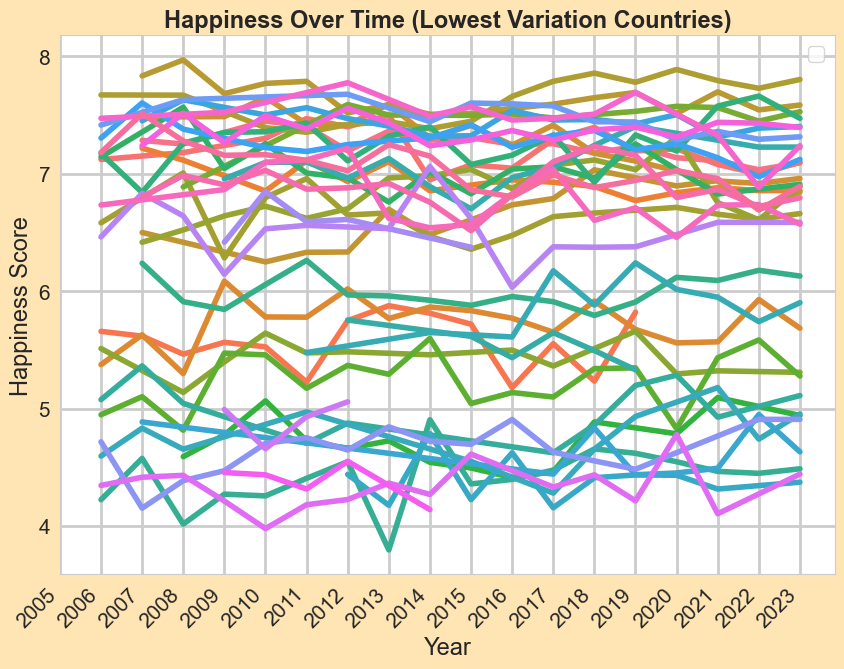

In [46]:
# Change of world happiness over time

ax = sns.lineplot(data=test_data[(test_data['year'] >= 2006) & (test_data['country_name'].isin(lowest_25perc_variation_countries))], x='year',y='happiness_score', linewidth=4.0, hue='country_name', errorbar=None)

ax.set_title('Happiness Over Time (Lowest Variation Countries)',fontweight="bold", size=17)
ax.legend([])
ax.set_xlabel('Year', size=17)
ax.set_ylabel('Happiness Score', size=17)
ax.set_xticks(year_labels)
ax.tick_params(labelsize=15)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')
ax.grid(linewidth=2)

In [47]:
# Countries with lowest variation in happiness avg happiness over time

test_data[(test_data['year'] >= 2006) & (test_data['country_name'].isin(lowest_25perc_variation_countries))].groupby('year')['happiness_score'].mean().reset_index().rename(columns={'happiness_score':'avg_happiness_score'})

,year,avg_happiness_score
0,2006,6.135642
1,2007,6.253588
2,2008,6.370305
3,2009,5.941068
4,2010,6.156742
5,2011,6.087890
6,2012,6.202522
7,2013,6.478584
8,2014,6.326119
9,2015,6.380832


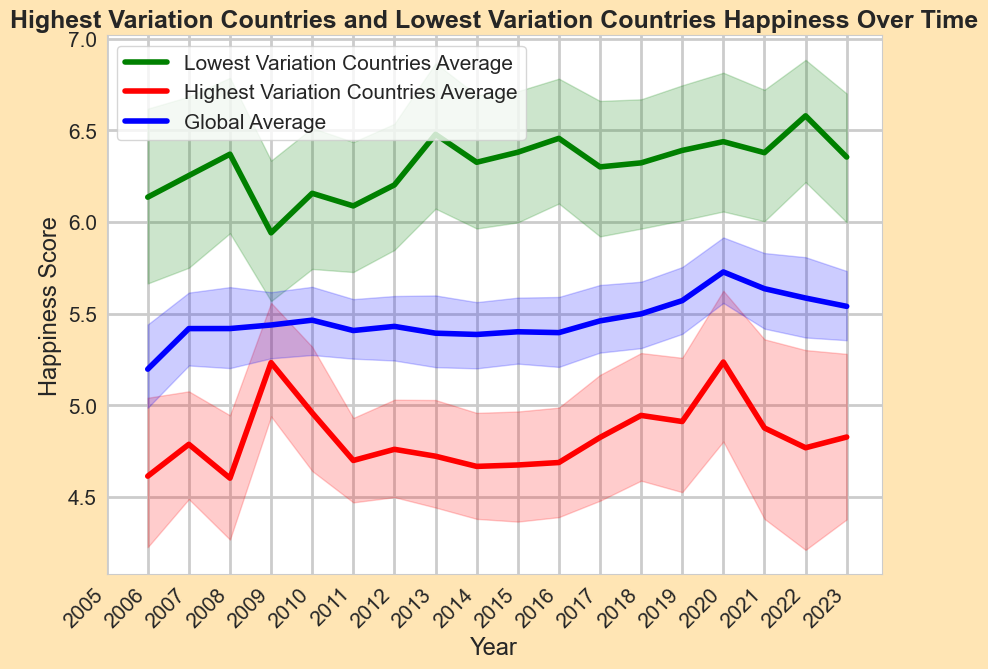

In [48]:
# Average global happines compared to highest variation average and lowest variation average

ax = sns.lineplot(data=test_data[(test_data['year'] >= 2006) & (test_data['country_name'].isin(lowest_25perc_variation_countries))], x='year',y='happiness_score', linewidth=4.0, color='green', label='Lowest Variation Countries Average')
ax = sns.lineplot(data=test_data[(test_data['year'] >= 2006) & (test_data['country_name'].isin(highest_25perc_variation_countries))], x='year',y='happiness_score', linewidth=4.0, color='red', label='Highest Variation Countries Average')
ax = sns.lineplot(data=test_data[test_data['year'] >= 2006], x='year',y='happiness_score', linewidth=4.0, color='blue', label='Global Average')

ax.set_title('Highest Variation Countries and Lowest Variation Countries Happiness Over Time',fontweight="bold")
ax.set_xlabel('Year', size=17)
ax.set_ylabel('Happiness Score', size=17)
ax.set_xticks(year_labels)
ax.legend(loc='upper left')
ax.tick_params(labelsize=15)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')
ax.grid(linewidth=2)

In [49]:
# Add global average to test_data_pivot
# Is an individual country's happiness affected by Global Happiness or are countries independent of the global average?

test_data_pivot

country_name,year,Afghanistan,Albania,Algeria,Angola,Argentina,Armenia,Australia,Austria,Azerbaijan,...,United Arab Emirates,United Kingdom,United States,Uruguay,Uzbekistan,Venezuela,Vietnam,Yemen,Zambia,Zimbabwe
1,2006,NaN,NaN,NaN,NaN,6.312925,4.289311,NaN,7.122211,4.727871,...,6.734222,NaN,7.181794,5.785868,5.232322,6.525146,5.293660,NaN,4.824455,3.826268
2,2007,NaN,4.634252,NaN,NaN,6.073158,4.881516,7.285391,NaN,4.568160,...,NaN,6.801931,7.512688,5.693946,NaN,NaN,5.421688,4.477133,3.998293,3.280247
3,2008,3.723590,NaN,NaN,NaN,5.961034,4.651972,7.253757,7.180954,4.817189,...,NaN,6.986464,7.280386,5.663870,5.311368,6.257771,5.480425,NaN,4.730263,3.174264
4,2009,4.401778,5.485470,NaN,NaN,6.424133,4.177582,NaN,NaN,4.573725,...,6.866063,6.906547,7.158032,6.296223,5.260721,7.188803,5.304265,4.809259,5.260361,4.055914
5,2010,4.758381,5.268937,5.463567,NaN,6.441067,4.367811,7.450047,7.302679,4.218611,...,7.097456,7.029364,7.163616,6.062011,5.095342,7.478455,5.295781,4.350313,NaN,4.681570
6,2011,3.831719,5.867422,5.317194,5.589001,6.775805,4.260491,7.405616,7.470513,4.680470,...,7.118701,6.869249,7.115139,6.554047,5.738744,6.579789,5.767344,3.746256,4.999114,4.845642
7,2012,3.782938,5.510124,5.604596,4.360250,6.468387,4.319712,7.195586,7.400689,4.910772,...,7.217767,6.880784,7.026227,6.449728,6.019332,7.066577,5.534570,4.060601,5.013375,4.955101
8,2013,3.572100,4.550648,NaN,3.937107,6.582260,4.277191,7.364169,7.498803,5.481178,...,6.620951,6.918055,7.249285,6.444465,5.939986,6.552796,5.022699,4.217679,5.243996,4.690188
9,2014,3.130896,4.813763,6.354898,3.794838,6.671114,4.453083,7.288550,6.950000,5.251530,...,6.539855,6.758148,7.151114,6.561444,6.049212,6.136096,5.084923,3.967958,4.345837,4.184451
10,2015,3.982855,4.606651,NaN,NaN,6.697131,4.348320,7.309061,7.076447,5.146775,...,6.568398,6.515445,6.863947,6.628080,5.972364,5.568800,5.076315,2.982674,4.843164,3.703191


In [50]:
global_average = test_data.groupby('year')['happiness_score'].mean().reset_index().rename(columns = {'happiness_score':'Global Average'})
global_average

,year,Global Average
0,2005,6.446164
1,2006,5.196935
2,2007,5.418291
3,2008,5.418554
4,2009,5.438050
5,2010,5.464247
6,2011,5.407746
7,2012,5.430382
8,2013,5.393302
9,2014,5.386267


In [51]:
# Merge

test_data_pivot = test_data_pivot.merge(global_average, on ='year')
test_data_pivot

,year,Afghanistan,Albania,Algeria,Angola,Argentina,Armenia,Australia,Austria,Azerbaijan,...,United Kingdom,United States,Uruguay,Uzbekistan,Venezuela,Vietnam,Yemen,Zambia,Zimbabwe,Global Average
0,2006,NaN,NaN,NaN,NaN,6.312925,4.289311,NaN,7.122211,4.727871,...,NaN,7.181794,5.785868,5.232322,6.525146,5.293660,NaN,4.824455,3.826268,5.196935
1,2007,NaN,4.634252,NaN,NaN,6.073158,4.881516,7.285391,NaN,4.568160,...,6.801931,7.512688,5.693946,NaN,NaN,5.421688,4.477133,3.998293,3.280247,5.418291
2,2008,3.723590,NaN,NaN,NaN,5.961034,4.651972,7.253757,7.180954,4.817189,...,6.986464,7.280386,5.663870,5.311368,6.257771,5.480425,NaN,4.730263,3.174264,5.418554
3,2009,4.401778,5.485470,NaN,NaN,6.424133,4.177582,NaN,NaN,4.573725,...,6.906547,7.158032,6.296223,5.260721,7.188803,5.304265,4.809259,5.260361,4.055914,5.438050
4,2010,4.758381,5.268937,5.463567,NaN,6.441067,4.367811,7.450047,7.302679,4.218611,...,7.029364,7.163616,6.062011,5.095342,7.478455,5.295781,4.350313,NaN,4.681570,5.464247
5,2011,3.831719,5.867422,5.317194,5.589001,6.775805,4.260491,7.405616,7.470513,4.680470,...,6.869249,7.115139,6.554047,5.738744,6.579789,5.767344,3.746256,4.999114,4.845642,5.407746
6,2012,3.782938,5.510124,5.604596,4.360250,6.468387,4.319712,7.195586,7.400689,4.910772,...,6.880784,7.026227,6.449728,6.019332,7.066577,5.534570,4.060601,5.013375,4.955101,5.430382
7,2013,3.572100,4.550648,NaN,3.937107,6.582260,4.277191,7.364169,7.498803,5.481178,...,6.918055,7.249285,6.444465,5.939986,6.552796,5.022699,4.217679,5.243996,4.690188,5.393302
8,2014,3.130896,4.813763,6.354898,3.794838,6.671114,4.453083,7.288550,6.950000,5.251530,...,6.758148,7.151114,6.561444,6.049212,6.136096,5.084923,3.967958,4.345837,4.184451,5.386267
9,2015,3.982855,4.606651,NaN,NaN,6.697131,4.348320,7.309061,7.076447,5.146775,...,6.515445,6.863947,6.628080,5.972364,5.568800,5.076315,2.982674,4.843164,3.703191,5.400948


In [52]:
# Correlation to Global Average

corr_matrix_global = test_data_pivot.corr(numeric_only = True, method = "pearson")['Global Average'].reset_index().rename(columns = {'index':'country_name', 'Global Average':'corr'})
corr_matrix_global.sort_values('corr', ascending=False).head(20)

,country_name,corr
14,Belize,1.000000
166,Global Average,1.000000
131,Slovakia,0.871683
100,Mongolia,0.844280
80,Kyrgyzstan,0.825522
54,Georgia,0.820082
47,Estonia,0.812705
132,Slovenia,0.807945
88,Luxembourg,0.778118
59,Guinea,0.772427


In [53]:
corr_matrix_global.describe()

,corr
count,162.000000
mean,0.158236
std,0.484519
min,-0.859665
25%,-0.258834
50%,0.226229
75%,0.566404
max,1.000000


In [54]:
corr_matrix_global['corr'].var()

0.23475886764645373

In [55]:
############

In [56]:
# Are countries with not enough reports skewing data?

country_n_reports = test_data.groupby('country_name')['happiness_score'].count().reset_index().rename(columns={'happiness_score':'n_reports'})
country_n_reports.sort_values('n_reports', ascending=False).describe()

,n_reports
count,165.000000
mean,14.278788
std,4.805469
min,1.000000
25%,13.000000
50%,16.000000
75%,18.000000
max,24.000000


In [57]:
# Filter for countries with more than 10 reports. (Atleast 11 years of reported data)
countries_more10reports = country_n_reports[country_n_reports['n_reports'] > 10].sort_values('n_reports', ascending=False)['country_name'].tolist()
print(test_data['country_name'].drop_duplicates().count(), country_n_reports[country_n_reports['n_reports'] > 10].sort_values('n_reports', ascending=True)['country_name'].count())
country_n_reports[country_n_reports['n_reports'] > 10].sort_values('n_reports', ascending=True).head(20)

165 138


,country_name,n_reports
2,Algeria,11
48,Ethiopia,11
60,Haiti,11
84,Liberia,11
80,Laos,11
64,Iceland,11
103,Myanmar,11
102,Mozambique,11
78,Kuwait,11
148,Togo,12


In [58]:
test_data_more10reports = test_data[test_data['country_name'].isin(countries_more10reports)]

In [59]:
test_data_more10reports_pivot = pd.pivot_table(test_data_more10reports, index='year', columns='country_name', values='happiness_score').reset_index()
test_data_more10reports_pivot = test_data_more10reports_pivot.drop(index=0)
test_data_more10reports_pivot

country_name,year,Afghanistan,Albania,Algeria,Argentina,Armenia,Australia,Austria,Azerbaijan,Bahrain,...,United Arab Emirates,United Kingdom,United States,Uruguay,Uzbekistan,Venezuela,Vietnam,Yemen,Zambia,Zimbabwe
1,2006,NaN,NaN,NaN,6.312925,4.289311,NaN,7.122211,4.727871,NaN,...,6.734222,NaN,7.181794,5.785868,5.232322,6.525146,5.293660,NaN,4.824455,3.826268
2,2007,NaN,4.634252,NaN,6.073158,4.881516,7.285391,NaN,4.568160,NaN,...,NaN,6.801931,7.512688,5.693946,NaN,NaN,5.421688,4.477133,3.998293,3.280247
3,2008,3.723590,NaN,NaN,5.961034,4.651972,7.253757,7.180954,4.817189,NaN,...,NaN,6.986464,7.280386,5.663870,5.311368,6.257771,5.480425,NaN,4.730263,3.174264
4,2009,4.401778,5.485470,NaN,6.424133,4.177582,NaN,NaN,4.573725,5.700523,...,6.866063,6.906547,7.158032,6.296223,5.260721,7.188803,5.304265,4.809259,5.260361,4.055914
5,2010,4.758381,5.268937,5.463567,6.441067,4.367811,7.450047,7.302679,4.218611,5.936869,...,7.097456,7.029364,7.163616,6.062011,5.095342,7.478455,5.295781,4.350313,NaN,4.681570
6,2011,3.831719,5.867422,5.317194,6.775805,4.260491,7.405616,7.470513,4.680470,4.823976,...,7.118701,6.869249,7.115139,6.554047,5.738744,6.579789,5.767344,3.746256,4.999114,4.845642
7,2012,3.782938,5.510124,5.604596,6.468387,4.319712,7.195586,7.400689,4.910772,5.027187,...,7.217767,6.880784,7.026227,6.449728,6.019332,7.066577,5.534570,4.060601,5.013375,4.955101
8,2013,3.572100,4.550648,NaN,6.582260,4.277191,7.364169,7.498803,5.481178,6.689711,...,6.620951,6.918055,7.249285,6.444465,5.939986,6.552796,5.022699,4.217679,5.243996,4.690188
9,2014,3.130896,4.813763,6.354898,6.671114,4.453083,7.288550,6.950000,5.251530,6.165134,...,6.539855,6.758148,7.151114,6.561444,6.049212,6.136096,5.084923,3.967958,4.345837,4.184451
10,2015,3.982855,4.606651,NaN,6.697131,4.348320,7.309061,7.076447,5.146775,6.007375,...,6.568398,6.515445,6.863947,6.628080,5.972364,5.568800,5.076315,2.982674,4.843164,3.703191


In [60]:
global_average_more10reports = test_data_more10reports.groupby('year')['happiness_score'].mean().reset_index().rename(columns = {'happiness_score':'Global Average'})
global_average_more10reports.drop(index=0).reset_index().drop('index', axis=1)

,year,Global Average
0,2006,5.175224
1,2007,5.420169
2,2008,5.428760
3,2009,5.482442
4,2010,5.502052
5,2011,5.452954
6,2012,5.460343
7,2013,5.422709
8,2014,5.445423
9,2015,5.427478


In [61]:
# Merge

test_data_more10reports_pivot = test_data_more10reports_pivot.merge(global_average_more10reports, on ='year')
test_data_more10reports_pivot

,year,Afghanistan,Albania,Algeria,Argentina,Armenia,Australia,Austria,Azerbaijan,Bahrain,...,United Kingdom,United States,Uruguay,Uzbekistan,Venezuela,Vietnam,Yemen,Zambia,Zimbabwe,Global Average
0,2006,NaN,NaN,NaN,6.312925,4.289311,NaN,7.122211,4.727871,NaN,...,NaN,7.181794,5.785868,5.232322,6.525146,5.293660,NaN,4.824455,3.826268,5.175224
1,2007,NaN,4.634252,NaN,6.073158,4.881516,7.285391,NaN,4.568160,NaN,...,6.801931,7.512688,5.693946,NaN,NaN,5.421688,4.477133,3.998293,3.280247,5.420169
2,2008,3.723590,NaN,NaN,5.961034,4.651972,7.253757,7.180954,4.817189,NaN,...,6.986464,7.280386,5.663870,5.311368,6.257771,5.480425,NaN,4.730263,3.174264,5.428760
3,2009,4.401778,5.485470,NaN,6.424133,4.177582,NaN,NaN,4.573725,5.700523,...,6.906547,7.158032,6.296223,5.260721,7.188803,5.304265,4.809259,5.260361,4.055914,5.482442
4,2010,4.758381,5.268937,5.463567,6.441067,4.367811,7.450047,7.302679,4.218611,5.936869,...,7.029364,7.163616,6.062011,5.095342,7.478455,5.295781,4.350313,NaN,4.681570,5.502052
5,2011,3.831719,5.867422,5.317194,6.775805,4.260491,7.405616,7.470513,4.680470,4.823976,...,6.869249,7.115139,6.554047,5.738744,6.579789,5.767344,3.746256,4.999114,4.845642,5.452954
6,2012,3.782938,5.510124,5.604596,6.468387,4.319712,7.195586,7.400689,4.910772,5.027187,...,6.880784,7.026227,6.449728,6.019332,7.066577,5.534570,4.060601,5.013375,4.955101,5.460343
7,2013,3.572100,4.550648,NaN,6.582260,4.277191,7.364169,7.498803,5.481178,6.689711,...,6.918055,7.249285,6.444465,5.939986,6.552796,5.022699,4.217679,5.243996,4.690188,5.422709
8,2014,3.130896,4.813763,6.354898,6.671114,4.453083,7.288550,6.950000,5.251530,6.165134,...,6.758148,7.151114,6.561444,6.049212,6.136096,5.084923,3.967958,4.345837,4.184451,5.445423
9,2015,3.982855,4.606651,NaN,6.697131,4.348320,7.309061,7.076447,5.146775,6.007375,...,6.515445,6.863947,6.628080,5.972364,5.568800,5.076315,2.982674,4.843164,3.703191,5.427478


In [62]:
# Correlation to Global Average

corr_matrix_global = test_data_more10reports_pivot.corr(numeric_only = True, method = "pearson")['Global Average'].reset_index().rename(columns = {'index':'country_name', 'Global Average':'corr'})
corr_matrix_global = corr_matrix_global.sort_values('corr', ascending=False)
corr_matrix_global = corr_matrix_global.drop(index=([0,138]))
corr_matrix_global.head(20)

,country_name,corr
139,Global Average,1.000000
111,Slovakia,0.920786
83,Mongolia,0.897359
43,Georgia,0.843528
67,Kyrgyzstan,0.835518
48,Guinea,0.820667
18,Bulgaria,0.803096
103,Romania,0.802055
38,Estonia,0.799391
112,Slovenia,0.775852


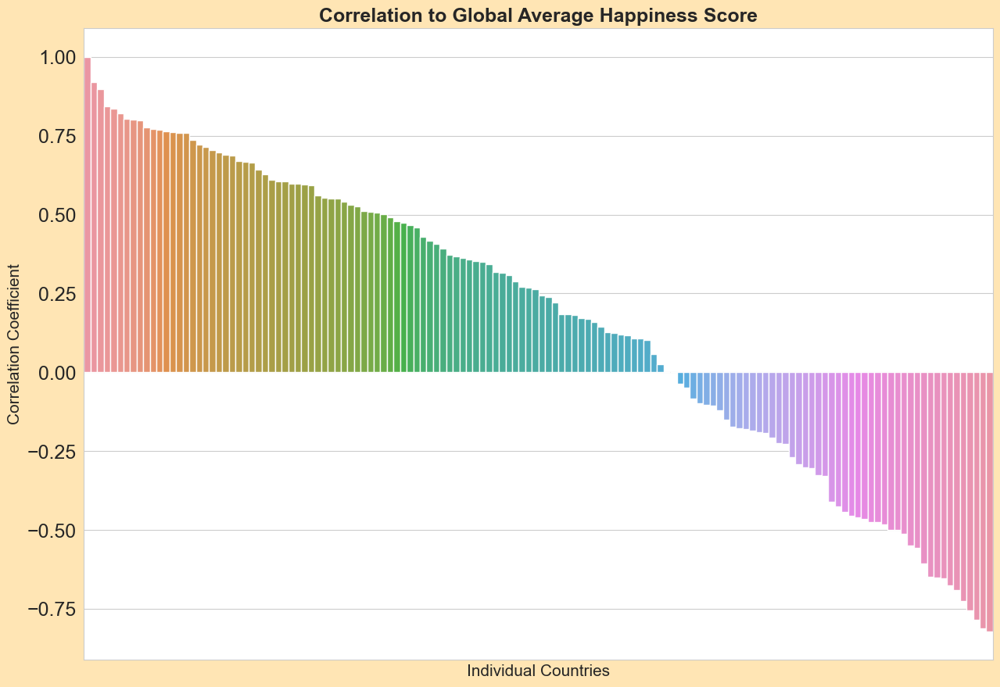

In [63]:
plt.rcParams['figure.figsize'] = (15,10.5)

ax = sns.barplot(data=corr_matrix_global, x='country_name', y='corr', width=1)

ax.set_title('Correlation to Global Average Happiness Score', fontweight="bold")
ax.set_xlabel('Individual Countries')
ax.set_ylabel('Correlation Coefficient')
ax.tick_params(labelsize=18, labelbottom=False)

In [64]:
corr_matrix_global['abs_corr'] = corr_matrix_global['corr'].abs()
corr_matrix_global['pos_neg'] = corr_matrix_global['corr'].apply(lambda x: 'Negative' if x < 0 else 'Positive')
corr_matrix_global = corr_matrix_global.sort_values('abs_corr', ascending=False)
corr_matrix_global.head(20)

,country_name,corr,abs_corr,pos_neg
139,Global Average,1.000000,1.000000,Positive
111,Slovakia,0.920786,0.920786,Positive
83,Mongolia,0.897359,0.897359,Positive
43,Georgia,0.843528,0.843528,Positive
67,Kyrgyzstan,0.835518,0.835518,Positive
62,Jordan,-0.820951,0.820951,Negative
48,Guinea,0.820667,0.820667,Positive
22,Canada,-0.811925,0.811925,Negative
18,Bulgaria,0.803096,0.803096,Positive
103,Romania,0.802055,0.802055,Positive


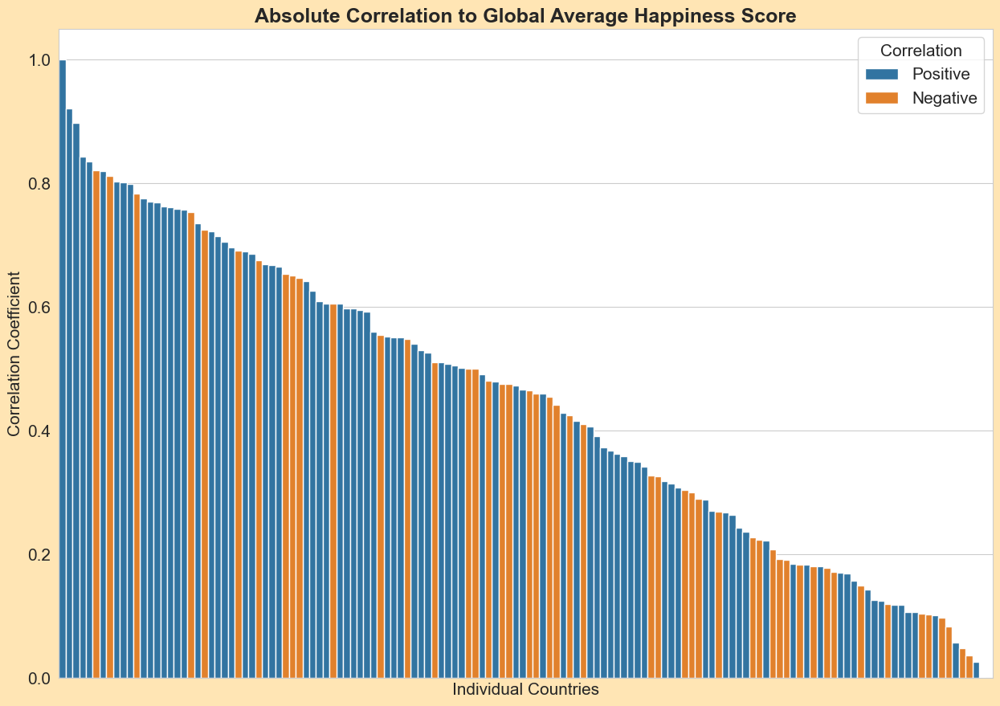

In [65]:
plt.rcParams['figure.figsize'] = (15,10.5)

ax = sns.barplot(data=corr_matrix_global, x='country_name', y='abs_corr', width=1, hue='pos_neg', dodge=False)

ax.set_title('Absolute Correlation to Global Average Happiness Score', fontweight="bold")
ax.legend(title='Correlation')
ax.set_xlabel('Individual Countries')
ax.set_ylabel('Correlation Coefficient')
ax.tick_params(labelbottom=False)

In [66]:
corr_describe = corr_matrix_global[['corr', 'abs_corr']].describe().reset_index().rename(columns={'index':'describe'})
corr_describe

,describe,corr,abs_corr
0,count,138.000000,138.000000
1,mean,0.172765,0.446010
2,std,0.479650,0.244443
3,min,-0.820951,0.001058
4,25%,-0.192491,0.225000
5,50%,0.253991,0.466255
6,75%,0.584258,0.649839
7,max,1.000000,1.000000


In [67]:
# Larger variance of correlation supports that a country's happiness is more independent rathen than dependent on the global average.

print(corr_matrix_global['corr'].var(), corr_matrix_global['abs_corr'].var())

0.23006409284696971 0.05975258590277432


In [68]:
corr_describe.loc[8] = ['variance', '0.201536', '0.0506649']
corr_describe

,describe,corr,abs_corr
0,count,138.0,138.0
1,mean,0.172765,0.44601
2,std,0.47965,0.244443
3,min,-0.820951,0.001058
4,25%,-0.192491,0.225
5,50%,0.253991,0.466255
6,75%,0.584258,0.649839
7,max,1.0,1.0
8,variance,0.201536,0.0506649


In [69]:
top_corr_matrix_global = corr_matrix_global.sort_values('corr', ascending=False).head(10)
bot_corr_matrix_global = corr_matrix_global.sort_values('corr', ascending=False).tail(10)
top_bot_corr_matrix_global = pd.concat([top_corr_matrix_global,bot_corr_matrix_global])
top_bot_corr_matrix_global

,country_name,corr,abs_corr,pos_neg
139,Global Average,1.000000,1.000000,Positive
111,Slovakia,0.920786,0.920786,Positive
83,Mongolia,0.897359,0.897359,Positive
43,Georgia,0.843528,0.843528,Positive
67,Kyrgyzstan,0.835518,0.835518,Positive
48,Guinea,0.820667,0.820667,Positive
18,Bulgaria,0.803096,0.803096,Positive
103,Romania,0.802055,0.802055,Positive
38,Estonia,0.799391,0.799391,Positive
112,Slovenia,0.775852,0.775852,Positive


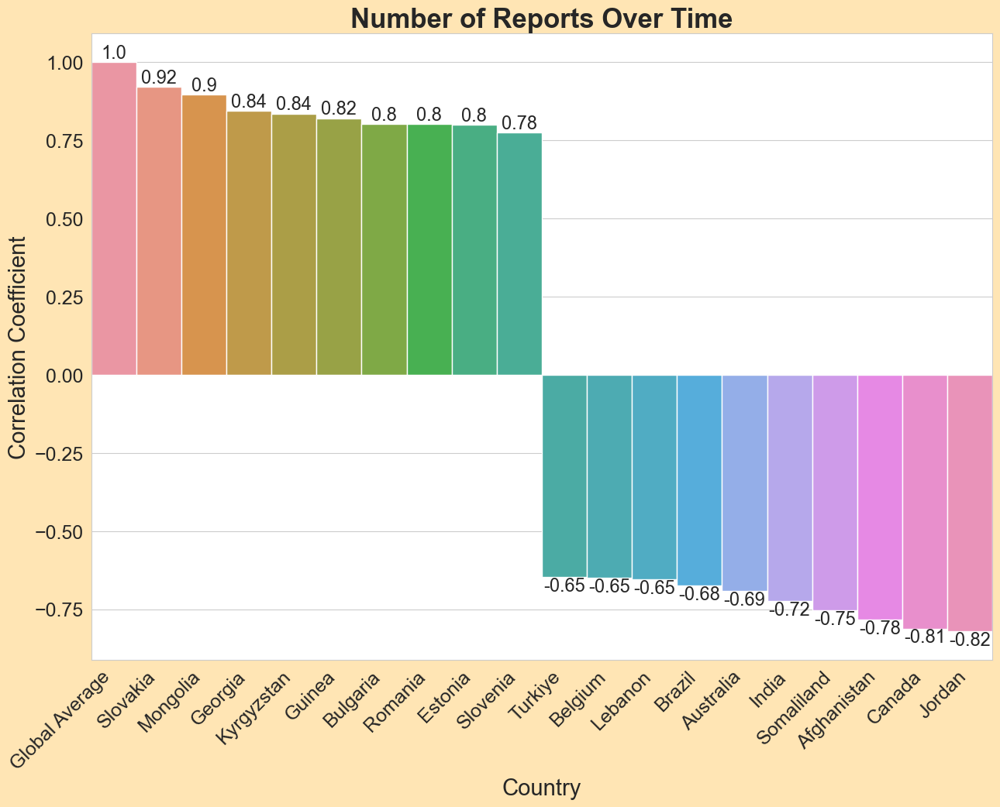

In [70]:
labels = top_bot_corr_matrix_global['corr'].round(decimals=2).tolist()

ax = sns.barplot(data=top_bot_corr_matrix_global, x='country_name', y='corr', width=1,)

ax.set_title('Number of Reports Over Time',fontweight="bold", size=25)
ax.set_xlabel('Country', size=21)
ax.set_ylabel('Correlation Coefficient', size=21)
ax.tick_params(labelsize=18)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')
ax.bar_label(ax.containers[0], labels=labels, size=17)

plt.show()

In [71]:
top_corr_matrix_global = corr_matrix_global.sort_values('corr', ascending=False).head(10)
bot_corr_matrix_global = corr_matrix_global.sort_values('corr', ascending=False).tail(10)
top_bot_corr_matrix_global = pd.concat([top_corr_matrix_global,bot_corr_matrix_global])
top_bot_corr_matrix_global

,country_name,corr,abs_corr,pos_neg
139,Global Average,1.000000,1.000000,Positive
111,Slovakia,0.920786,0.920786,Positive
83,Mongolia,0.897359,0.897359,Positive
43,Georgia,0.843528,0.843528,Positive
67,Kyrgyzstan,0.835518,0.835518,Positive
48,Guinea,0.820667,0.820667,Positive
18,Bulgaria,0.803096,0.803096,Positive
103,Romania,0.802055,0.802055,Positive
38,Estonia,0.799391,0.799391,Positive
112,Slovenia,0.775852,0.775852,Positive


In [72]:
corr_matrix_global['abs_corr'] = corr_matrix_global['corr'].abs()

In [73]:
top_corr_matrix_global = corr_matrix_global.sort_values('abs_corr', ascending=False).head(10)
bot_corr_matrix_global = corr_matrix_global.sort_values('abs_corr', ascending=False).tail(10)
top_bot_corr_matrix_global = pd.concat([top_corr_matrix_global,bot_corr_matrix_global])
top_bot_corr_matrix_global['pos_neg'] = top_bot_corr_matrix_global['corr'].apply(lambda x: 'Negative' if x < 0 else 'Positive')
top_bot_corr_matrix_global

,country_name,corr,abs_corr,pos_neg
139,Global Average,1.000000,1.000000,Positive
111,Slovakia,0.920786,0.920786,Positive
83,Mongolia,0.897359,0.897359,Positive
43,Georgia,0.843528,0.843528,Positive
67,Kyrgyzstan,0.835518,0.835518,Positive
62,Jordan,-0.820951,0.820951,Negative
48,Guinea,0.820667,0.820667,Positive
22,Canada,-0.811925,0.811925,Negative
18,Bulgaria,0.803096,0.803096,Positive
103,Romania,0.802055,0.802055,Positive


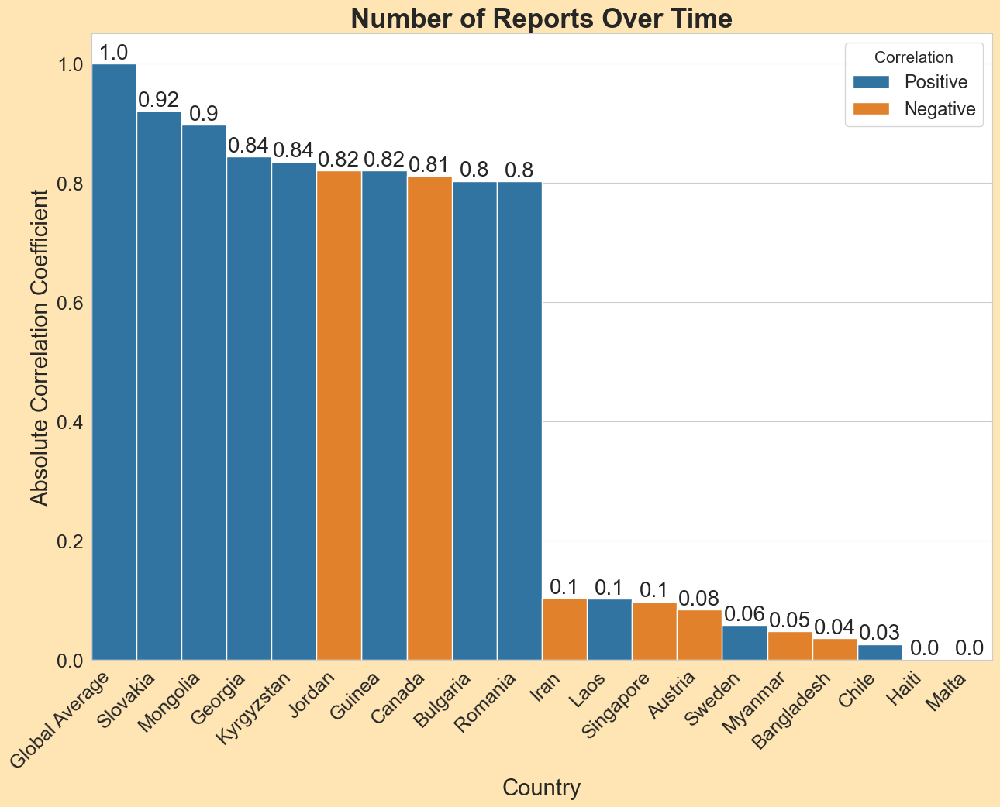

In [74]:
labels = top_bot_corr_matrix_global['abs_corr'].round(decimals=2).tolist()

ax = sns.barplot(data=top_bot_corr_matrix_global, x='country_name', y='abs_corr', width=1, hue='pos_neg', dodge=False)

ax.set_title('Number of Reports Over Time',fontweight="bold", size=25)
ax.legend(title='Correlation',fontsize=17, loc = 'upper right')
ax.set_xlabel('Country', size=21)
ax.set_ylabel('Absolute Correlation Coefficient', size=21)
ax.tick_params(labelsize=18)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')
ax.bar_label(ax.containers[1], labels=labels, size=20)
ax.bar_label(ax.containers[0], labels=labels, size=20)

plt.show()

In [75]:
# print(test_data_more10reports.groupby('country_name')['happiness_score'].mean().count())
# test_data_more10reports_avg = test_data_more10reports.groupby('country_name')['happiness_score'].mean().reset_index().rename(columns={'happiness_score':'avg_happiness_score'})
# test_data_more10reports_avg.head(20)

In [76]:
# corr_matrix_global = corr_matrix_global.merge(test_data_more10reports_avg, on='country_name')

In [77]:
corr_matrix_global = corr_matrix_global.merge(test_data_more10reports[['country_name', 'region']].drop_duplicates(), on='country_name')
corr_matrix_global.head(10)

,country_name,corr,abs_corr,pos_neg,region
0,Slovakia,0.920786,0.920786,Positive,Europe
1,Mongolia,0.897359,0.897359,Positive,Asia & Pacific
2,Georgia,0.843528,0.843528,Positive,Europe
3,Kyrgyzstan,0.835518,0.835518,Positive,Asia & Pacific
4,Jordan,-0.820951,0.820951,Negative,Middle east
5,Guinea,0.820667,0.820667,Positive,Africa
6,Canada,-0.811925,0.811925,Negative,North America
7,Bulgaria,0.803096,0.803096,Positive,Europe
8,Romania,0.802055,0.802055,Positive,Europe
9,Estonia,0.799391,0.799391,Positive,Europe


In [78]:
import random

random_sample = corr_matrix_global

In [79]:
random_sample['random'] = pd.Series(random.choices(random_sample.index.to_list(), k=len(random_sample)),index=random_sample.index)

Text(0, 0.5, 'Correlation')

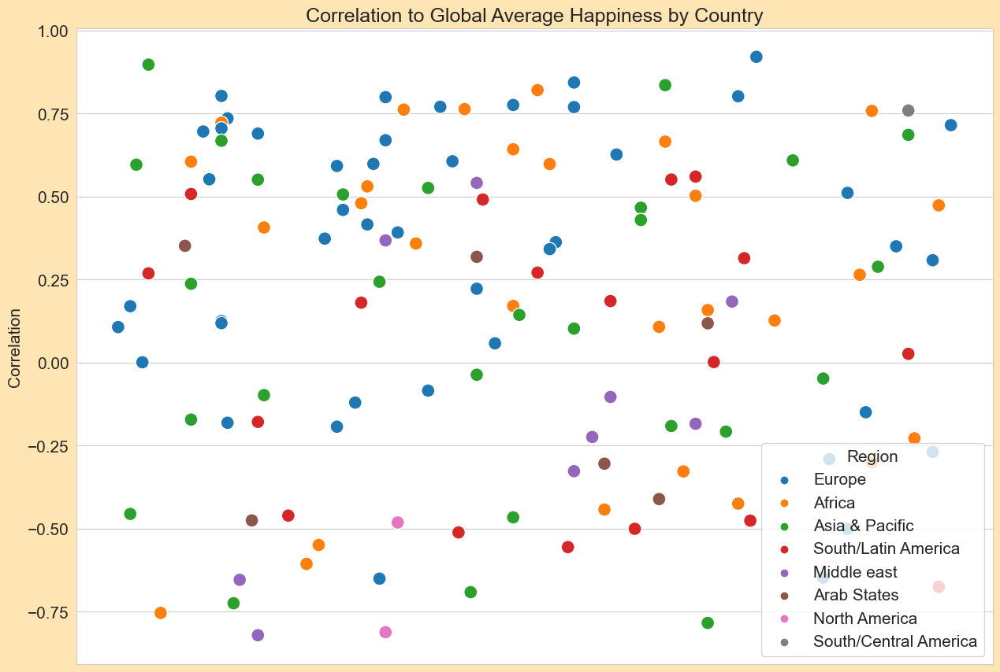

In [80]:
plt.rcParams['figure.figsize'] = (15,10.5)
plt.title('Correlation to Global Average Happiness by Country')
sns.scatterplot(data = random_sample, x ='random', y ='corr', hue='region',
                                     hue_order = legend,
                                     s = 150)
plt.legend(title='Region')   
plt.xticks([])
plt.xlabel('')
plt.ylabel('Correlation')

Text(0, 0.5, 'Correlation')

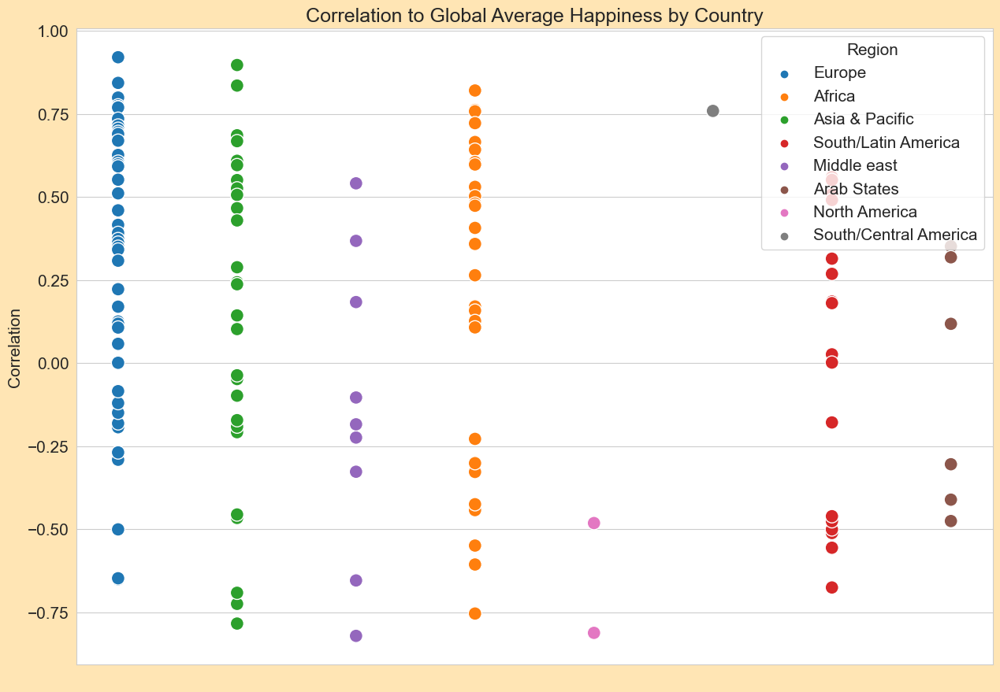

In [81]:
plt.rcParams['figure.figsize'] = (15,10.5)
plt.title('Correlation to Global Average Happiness by Country')
sns.scatterplot(data = corr_matrix_global, x ='region', y ='corr', hue='region',
                                     hue_order = legend,
                                     s = 150)
plt.legend(title='Region')   
plt.xticks([])
plt.xlabel(' ')
plt.ylabel('Correlation')

In [82]:
legend_region_order = corr_matrix_global['region'].drop_duplicates().reset_index().drop('index',axis=1)
legend_region_order['legend_order'] = ([1,2,3,4,1,6,7,8,9])
legend_region_order

,region,legend_order
0,Europe,1
1,Asia & Pacific,2
2,Middle east,3
3,Africa,4
4,North America,1
5,South/Central America,6
6,South/Latin America,7
7,Arab States,8
8,NaN,9


In [83]:
random_region = corr_matrix_global.sort_values(['region','random']).reset_index().drop('index',axis=1).reset_index()
random_region.head(10)

,index,country_name,corr,abs_corr,pos_neg,region,random
0,0,Somaliland,-0.753758,0.753758,Negative,Africa,7
1,1,Burkina Faso,0.605160,0.605160,Positive,Africa,12
2,2,Gabon,0.722402,0.722402,Positive,Africa,17
3,3,Mozambique,0.407041,0.407041,Positive,Africa,24
4,4,Botswana,-0.606138,0.606138,Negative,Africa,31
5,5,Rwanda,-0.549158,0.549158,Negative,Africa,33
6,6,Liberia,0.480094,0.480094,Positive,Africa,40
7,7,Chad,0.530586,0.530586,Positive,Africa,41
8,8,Congo Brazzaville,0.762054,0.762054,Positive,Africa,47
9,9,Kenya,0.358804,0.358804,Positive,Africa,49


In [84]:
random_region = random_region.merge(legend_region_order, how='left', on='region')

In [85]:
random_region = random_region.drop('index',axis=1).sort_values(['legend_order','random']).reset_index().drop('index',axis=1).reset_index()
random_region.head(20)

,index,country_name,corr,abs_corr,pos_neg,region,random,legend_order
0,0,United Kingdom,0.107088,0.107088,Positive,Europe,0,1
1,1,Azerbaijan,0.169940,0.169940,Positive,Europe,2,1
2,2,Malta,0.001058,0.001058,Positive,Europe,4,1
3,3,Serbia,0.696059,0.696059,Positive,Europe,14,1
4,4,Lithuania,0.552194,0.552194,Positive,Europe,15,1
5,5,Bulgaria,0.803096,0.803096,Positive,Europe,17,1
6,6,Montenegro,0.705408,0.705408,Positive,Europe,17,1
7,7,Cyprus,0.125211,0.125211,Positive,Europe,17,1
8,8,France,0.118803,0.118803,Positive,Europe,17,1
9,9,Latvia,0.735635,0.735635,Positive,Europe,18,1


Text(0, 0.5, 'Correlation')

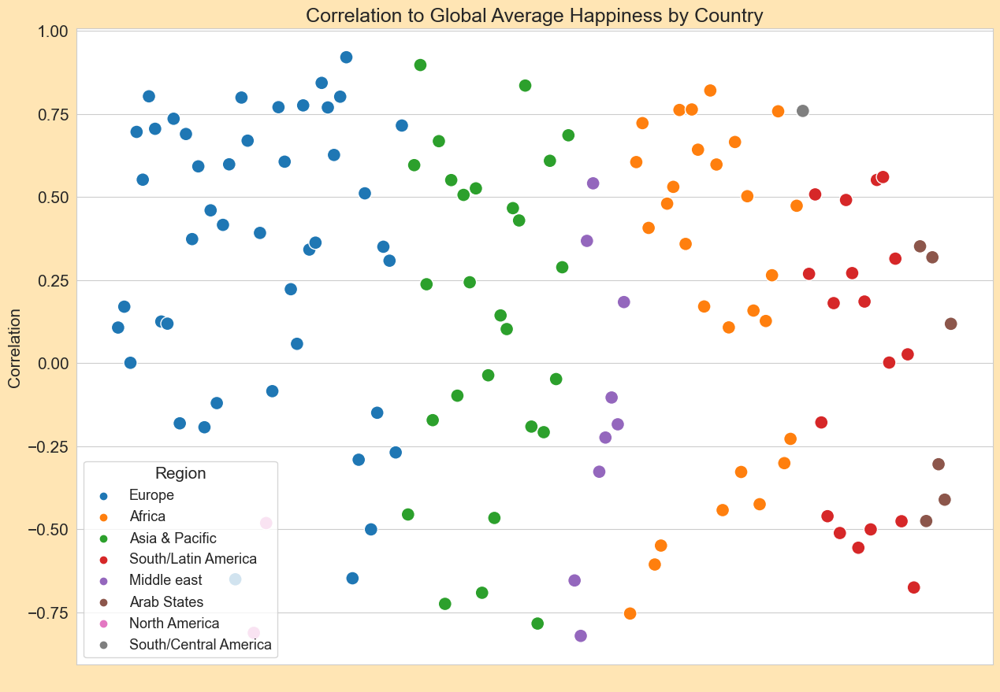

In [86]:
plt.rcParams['figure.figsize'] = (15,10.5)
plt.title('Correlation to Global Average Happiness by Country')
sns.scatterplot(data = random_region, x ='index', y ='corr', hue='region',
                                     hue_order = legend,
                                     s = 150)
plt.legend(title='Region', loc ='lower left', fontsize="13")   
plt.xticks([])
plt.xlabel(' ')
plt.ylabel('Correlation')

Text(717.0833333333334, 0.5, 'Correlation')

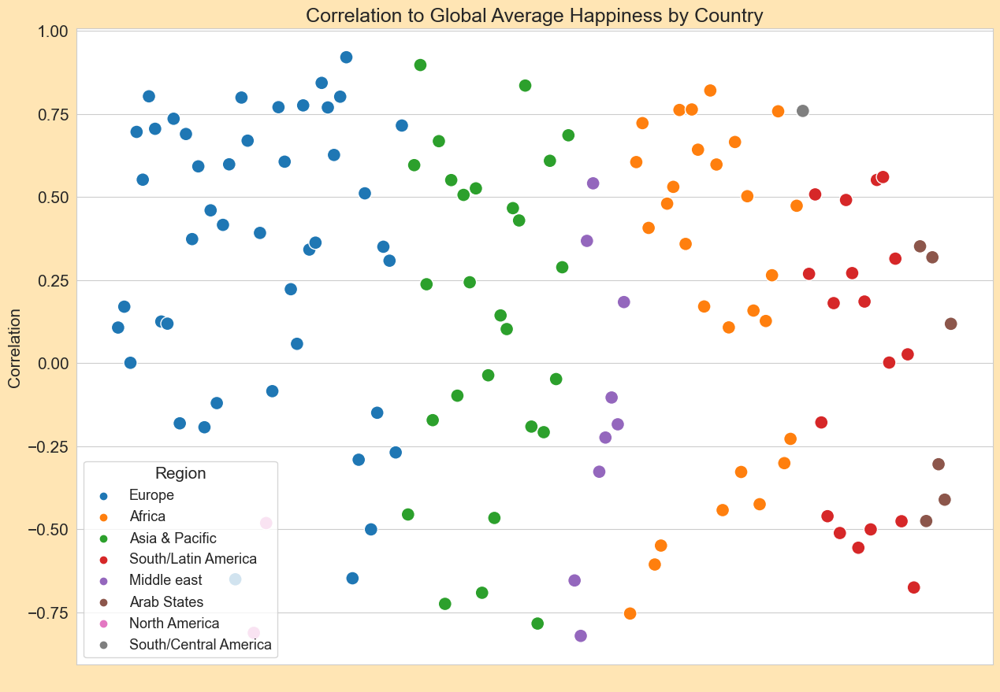

In [87]:
plt.rcParams['figure.figsize'] = (15,10.5)
plt.title('Correlation to Global Average Happiness by Country')
sns.scatterplot(data = random_region, x ='index', y ='corr', hue='region',
                                     hue_order = legend,
                                     s = 150).figure.savefig('output_figure.png',dpi=600)
plt.legend(title='Region', loc ='lower left', fontsize="13")
plt.xticks([])
plt.xlabel(' ')
plt.ylabel('Correlation')

In [88]:
list(test_data_more10reports_pivot.columns)

['year',
 'Afghanistan',
 'Albania',
 'Algeria',
 'Argentina',
 'Armenia',
 'Australia',
 'Austria',
 'Azerbaijan',
 'Bahrain',
 'Bangladesh',
 'Belarus',
 'Belgium',
 'Benin',
 'Bolivia',
 'Bosnia and Herzegovina',
 'Botswana',
 'Brazil',
 'Bulgaria',
 'Burkina Faso',
 'Cambodia',
 'Cameroon',
 'Canada',
 'Chad',
 'Chile',
 'China',
 'Colombia',
 'Congo Brazzaville',
 'Costa Rica',
 'Croatia',
 'Cyprus',
 'Czech Republic',
 "Côte D'Ivoire",
 'Denmark',
 'Dominican Republic',
 'Ecuador',
 'Egypt',
 'El Salvador',
 'Estonia',
 'Ethiopia',
 'Finland',
 'France',
 'Gabon',
 'Georgia',
 'Germany',
 'Ghana',
 'Greece',
 'Guatemala',
 'Guinea',
 'Haiti',
 'Honduras',
 'Hong Kong',
 'Hungary',
 'Iceland',
 'India',
 'Indonesia',
 'Iran',
 'Iraq',
 'Ireland',
 'Israel',
 'Italy',
 'Japan',
 'Jordan',
 'Kazakhstan',
 'Kenya',
 'Kosovo',
 'Kuwait',
 'Kyrgyzstan',
 'Laos',
 'Latvia',
 'Lebanon',
 'Liberia',
 'Lithuania',
 'Luxembourg',
 'Macedonia',
 'Madagascar',
 'Malawi',
 'Malaysia',
 'Mali',

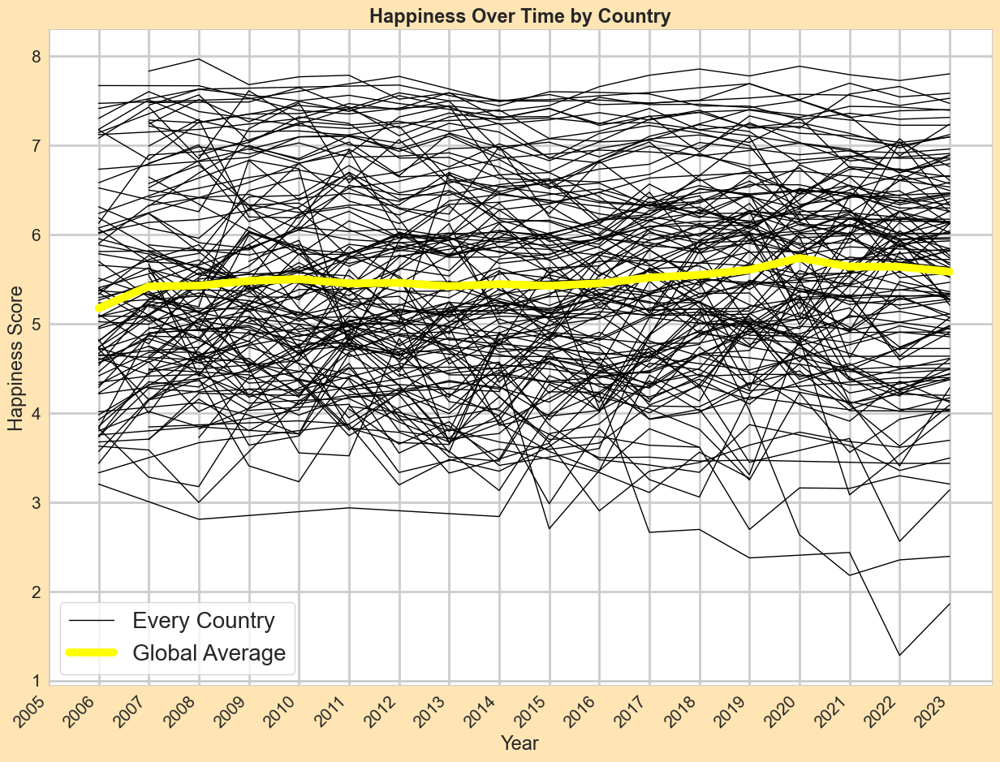

In [89]:
# Change of world happiness over time

ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Afghanistan',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Albania',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Algeria',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Argentina',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Armenia',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Australia',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Austria',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Azerbaijan',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Bahrain',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Bangladesh',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Belarus',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Belgium',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Benin',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Bolivia',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Bosnia and Herzegovina',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Botswana',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Brazil',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Bulgaria',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Burkina Faso',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Cambodia',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Cameroon',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Canada',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Chad',color='black', linewidth=1, label='Every Country')
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Chile',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='China',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Colombia',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Congo Brazzaville',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Costa Rica',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Croatia',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Cyprus',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Czech Republic',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Denmark',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Dominican Republic',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Ecuador',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Egypt',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='El Salvador',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Estonia',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Ethiopia',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Finland',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='France',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Gabon',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Georgia',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Germany',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Ghana',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Greece',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Guatemala',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Guinea',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Haiti',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Honduras',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Hong Kong',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Hungary',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Iceland',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='India',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Indonesia',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Iran',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Iraq',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Ireland',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Israel',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Italy',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Japan',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Jordan',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Kazakhstan',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Kenya',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Kosovo',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Kuwait',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Kyrgyzstan',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Laos',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Lebanon',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Liberia',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Lithuania',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Luxembourg',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Macedonia',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Madagascar',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Malawi',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Malaysia',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Mali',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Malta',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Mauritania',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Mexico',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Moldova',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Mongolia',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Montenegro',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Morocco',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Mozambique',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Myanmar',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Nepal',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Netherlands',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='New Zealand',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Nicaragua',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Niger',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Nigeria',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Norway',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Pakistan',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Palestine',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Panama',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Paraguay',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Peru',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Philippines',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Poland',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Portugal',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Romania',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Russia',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Rwanda',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Saudi Arabia',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Senegal',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Serbia',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Sierra Leone',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Slovakia',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Slovenia',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='South Korea',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='South Africa',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Spain',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Sri Lanka',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Switzerland',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Sweden',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Taiwan',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Tajikistan',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Tanzania',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Thailand',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Togo',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Tunisia',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Turkiye',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Uganda',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='United Arab Emirates',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Ukraine',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='United Kingdom',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='United States',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Uruguay',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Uzbekistan',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Venezuela',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Vietnam',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Yemen',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Zambia',color='black', linewidth=1)
ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Zimbabwe',color='black', linewidth=1)

ax = sns.lineplot(data=test_data_more10reports_pivot, x='year', y='Global Average', color='yellow', linewidth=7, label='Global Average')

ax.set_title('Happiness Over Time by Country',fontweight="bold", size=17)
ax.legend(loc='lower left', fontsize=20)
ax.set_xlabel('Year', size=17)
ax.set_ylabel('Happiness Score', size=17)
ax.set_xticks(year_labels)
ax.tick_params(labelsize=15)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')
ax.grid(linewidth=2)

In [90]:
#################

In [91]:
##### 1 consecutive year
test_data = data
test_data_2 = test_data[['country_name', 'year', 'happiness_score']].sort_values(['country_name','year'])

In [92]:
# Find the difference between 1 consecutive years by country

test_data_2['diff']=test_data_2.groupby(['country_name',test_data_2['year'].diff().ne(1).cumsum()])['happiness_score'].diff(1)
test_data_2.head(20)

,country_name,year,happiness_score,diff
0,Afghanistan,2008,3.723590,NaN
1,Afghanistan,2009,4.401778,0.678188
2,Afghanistan,2010,4.758381,0.356603
3,Afghanistan,2011,3.831719,-0.926662
4,Afghanistan,2012,3.782938,-0.048782
5,Afghanistan,2013,3.572100,-0.210837
6,Afghanistan,2014,3.130896,-0.441205
7,Afghanistan,2015,3.982855,0.851959
8,Afghanistan,2016,4.220169,0.237314
9,Afghanistan,2017,2.661718,-1.558450


In [93]:
top_1year_index = test_data_2.sort_values('diff', ascending = False).head(5).index.tolist()
bottom_1year_index = test_data_2.sort_values('diff', ascending = True).head(5).index.tolist()

In [94]:
top_1year_index

[132, 627, 2335, 614, 246]

In [95]:
bottom_1year_index

[629, 1196, 2336, 9, 2284]

In [96]:
a = top_1year_index
a = [x - 1 for x in a]
a

[131, 626, 2334, 613, 245]

In [97]:
top_1year_index = top_1year_index + a
top_1year_index.sort()
top_1year_index

[131, 132, 245, 246, 613, 614, 626, 627, 2334, 2335]

In [98]:
top_1year = test_data_2.iloc[top_1year_index].reset_index().drop('index', axis=1)
top_1year

,country_name,year,happiness_score,diff
0,Bahrain,2012,5.027187,0.203211
1,Bahrain,2013,6.689711,1.662524
2,Botswana,2011,3.519921,-0.033099
3,Botswana,2012,4.835939,1.316018
4,Egypt,2013,3.558520,-0.645637
5,Egypt,2014,4.885073,1.326552
6,El Salvador,2008,5.191494,-0.104041
7,El Salvador,2009,6.839087,1.647593
8,Zambia,2019,3.306797,-0.734692
9,Zambia,2020,4.837992,1.531196


In [99]:


top_1year['diff'] = top_1year['happiness_score'] - top_1year.groupby('country_name')['happiness_score'].shift(1)
top_1year

,country_name,year,happiness_score,diff
0,Bahrain,2012,5.027187,NaN
1,Bahrain,2013,6.689711,1.662524
2,Botswana,2011,3.519921,NaN
3,Botswana,2012,4.835939,1.316018
4,Egypt,2013,3.558520,NaN
5,Egypt,2014,4.885073,1.326552
6,El Salvador,2008,5.191494,NaN
7,El Salvador,2009,6.839087,1.647593
8,Zambia,2019,3.306797,NaN
9,Zambia,2020,4.837992,1.531196


<Axes: xlabel='year', ylabel='happiness_score'>

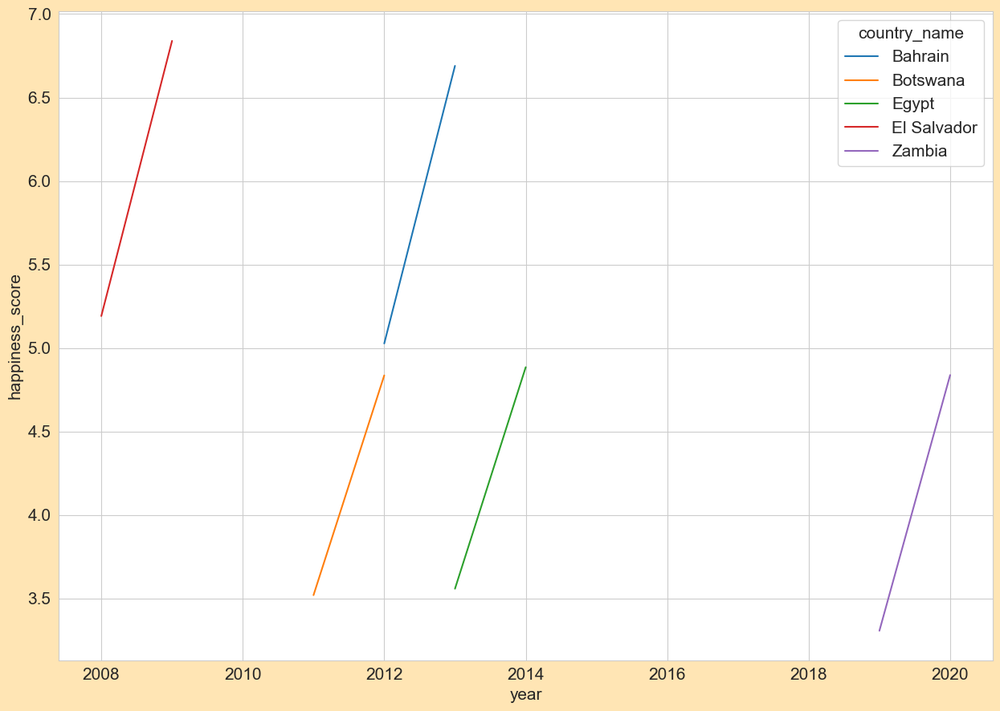

In [100]:
sns.lineplot(data=top_1year, x = 'year', y = 'happiness_score', hue  = 'country_name')

In [101]:
top_1year_countries = top_1year['country_name'].drop_duplicates().tolist()

top_1year_all = test_data_2[test_data_2['country_name'].isin(top_1year_countries)]

<Axes: xlabel='year', ylabel='happiness_score'>

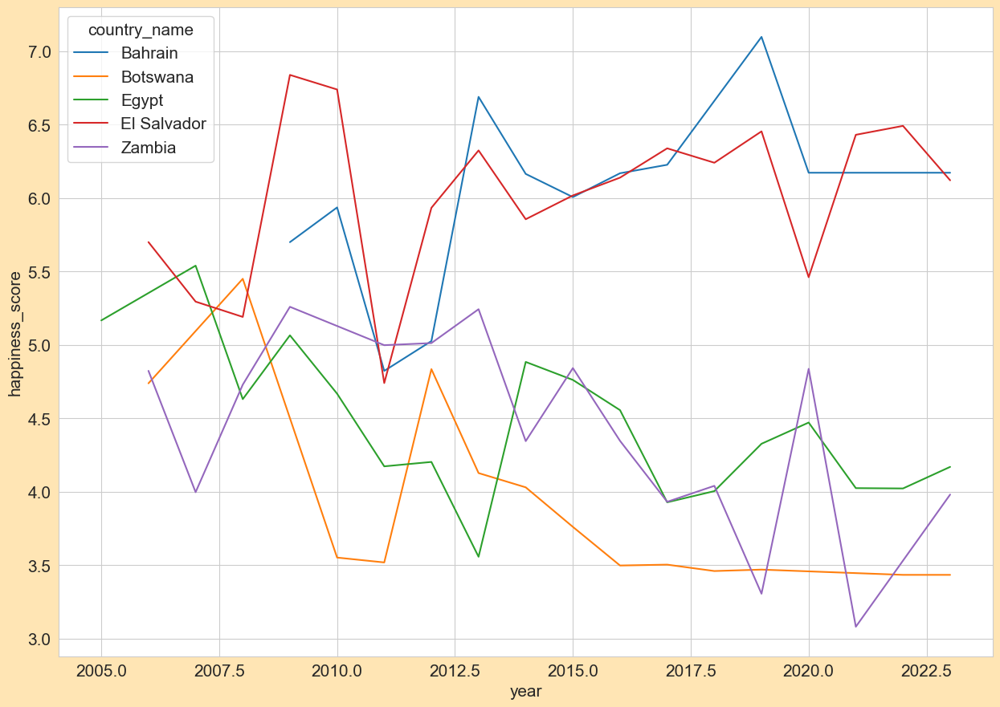

In [102]:
sns.lineplot(data=top_1year_all, x = 'year', y = 'happiness_score', hue = 'country_name')

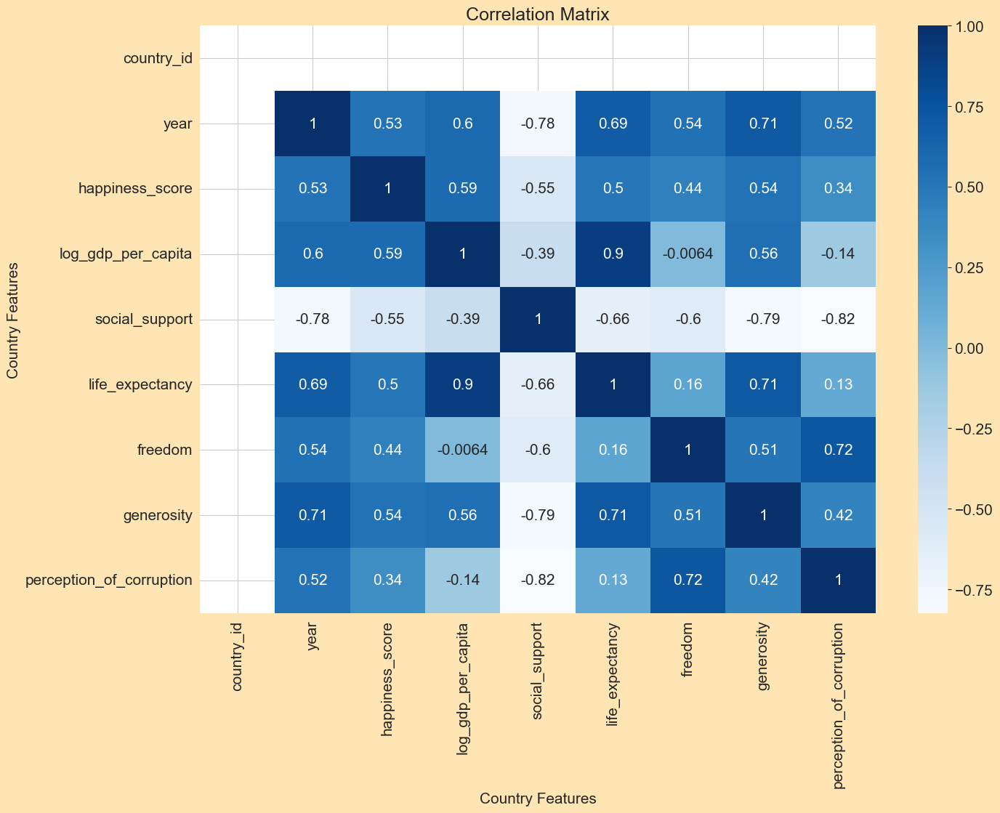

In [103]:
corr = data[data['country_name'] == 'Bahrain'].corr(numeric_only = True, method = "pearson")
sns.heatmap(corr, annot=True, cmap="Blues")

plt.title('Correlation Matrix')
plt.xlabel('Country Features')
plt.ylabel('Country Features')

plt.show()

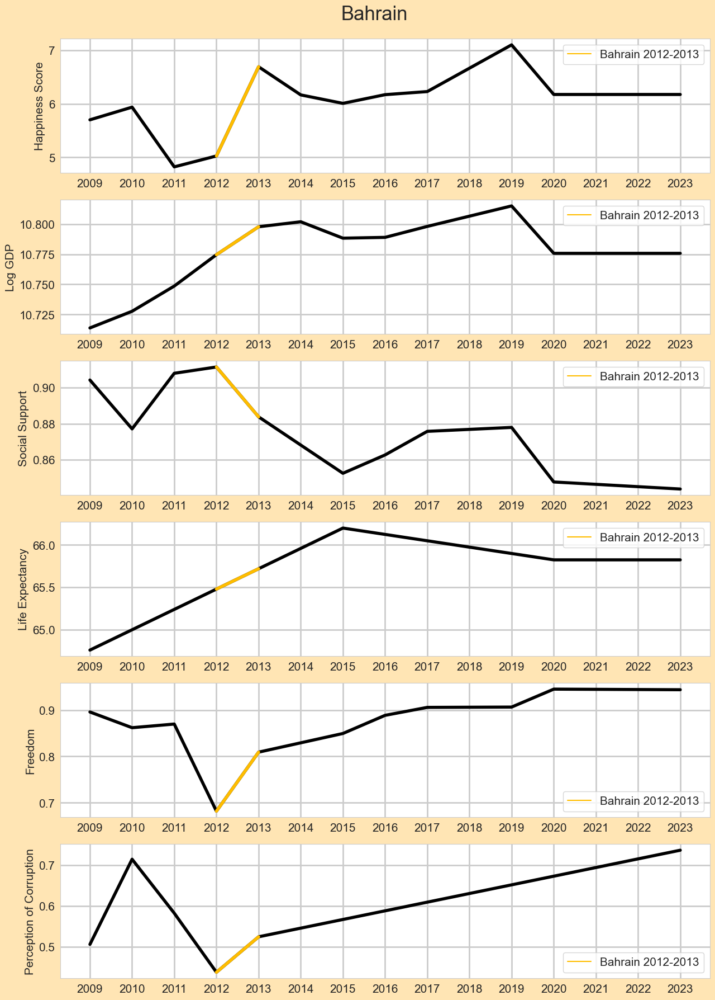

In [104]:
Bahrain_2012_2013 = data[(data['country_name'] == 'Bahrain') & (data['year'].isin([2012, 2013]) == True)]
Bahrain_2012_2013.loc[Bahrain_2012_2013['country_name'] == 'Bahrain', 'country_name'] = 'Bahrain 2012-2013'

fig, ax = plt.subplots(6, 1, figsize=(15, 20))
fig.suptitle('Bahrain', fontsize=25)
fig.subplots_adjust(top=0.95)

years = data[data['year'] > 2008]['year'].drop_duplicates().sort_values().tolist()

sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='happiness_score', linewidth=4.0, color='black', ax=ax[0])
sns.lineplot(data=Bahrain_2012_2013, x='year', y='happiness_score', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[0])
ax[0].set(xticks=years)
ax[0].set_xlabel('')
ax[0].set_ylabel('Happiness Score')
ax[0].grid(linewidth=2)
ax[0].legend(title='')

sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='log_gdp_per_capita', linewidth=4.0, color='black', ax=ax[1])
sns.lineplot(data=Bahrain_2012_2013, x='year', y='log_gdp_per_capita', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[1])
ax[1].set(xticks=years)
ax[1].set_xlabel('')
ax[1].set_ylabel('Log GDP')
ax[1].grid(linewidth=2)
ax[1].legend(title='')

sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='social_support', linewidth=4.0, color='black', ax=ax[2])
sns.lineplot(data=Bahrain_2012_2013, x='year', y='social_support', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[2])
ax[2].set(xticks=years)
ax[2].set_xlabel('')
ax[2].set_ylabel('Social Support')
ax[2].grid(linewidth=2)
ax[2].legend(title='')

sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='life_expectancy', linewidth=4.0, color='black', ax=ax[3])
sns.lineplot(data=Bahrain_2012_2013, x='year', y='life_expectancy', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[3])
ax[3].set(xticks=years)
ax[3].set_xlabel('')
ax[3].set_ylabel('Life Expectancy')
ax[3].grid(linewidth=2)
ax[3].legend(title='')

sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='freedom', linewidth=4.0, color='black', ax=ax[4])
sns.lineplot(data=Bahrain_2012_2013, x='year', y='freedom', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[4])
ax[4].set(xticks=years)
ax[4].set_xlabel('')
ax[4].set_ylabel('Freedom')
ax[4].grid(linewidth=2)
ax[4].legend(title='', loc='lower right' )


sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='perception_of_corruption', linewidth=4.0, color='black', ax=ax[5])
sns.lineplot(data=Bahrain_2012_2013, x = 'year', y = 'perception_of_corruption', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[5])
ax[5].set(xticks= years)
ax[5].set_xlabel('')
ax[5].set_ylabel('Perception of Corruption')
ax[5].grid(linewidth=2)
ax[5].legend(title='')


### 1 consecutive year

In [105]:
test_data = data
con_01 = test_data[['country_name', 'year', 'happiness_score']].sort_values(['country_name','year'])

In [106]:
# Find the difference between 2 consecutive years by country

con_01['diff']= con_01.groupby(['country_name',con_01['year'].diff().ne(1).cumsum()])['happiness_score'].diff(1)
con_01_all_diff = con_01[con_01['diff'].isna() == False]

print(con_01.shape)
con_01.head(20)

(2356, 4)


,country_name,year,happiness_score,diff
0,Afghanistan,2008,3.723590,NaN
1,Afghanistan,2009,4.401778,0.678188
2,Afghanistan,2010,4.758381,0.356603
3,Afghanistan,2011,3.831719,-0.926662
4,Afghanistan,2012,3.782938,-0.048782
5,Afghanistan,2013,3.572100,-0.210837
6,Afghanistan,2014,3.130896,-0.441205
7,Afghanistan,2015,3.982855,0.851959
8,Afghanistan,2016,4.220169,0.237314
9,Afghanistan,2017,2.661718,-1.558450


In [107]:
con_01['diff'].describe()

count    1980.000000
mean        0.010683
std         0.378108
min        -1.998616
25%        -0.179920
50%         0.015136
75%         0.208412
max         1.662524
Name: diff, dtype: float64

In [108]:
# Mean and Standard Deviation

con_01_mean = 0.010683
con_01_std = 0.378108

# 2 Standard Deviations

print(con_01_std * 2)

0.756216


In [109]:
# show differences that are unusallly large (2 standard deviations away)

con_01_top = con_01[con_01['diff'] > con_01_mean + (con_01_std * 2)].sort_values('diff', ascending=False)

print(con_01_top.shape)
print(con_01_mean + (con_01_std * 2))
con_01_top.sort_values('diff', ascending=False).head(20)

(56, 4)
0.766899


,country_name,year,happiness_score,diff
132,Bahrain,2013,6.689711,1.662524
627,El Salvador,2009,6.839087,1.647593
2335,Zambia,2020,4.837992,1.531196
614,Egypt,2014,4.885073,1.326552
246,Botswana,2012,4.835939,1.316018
818,Guinea,2017,4.873723,1.270868
1565,Nigeria,2020,5.502948,1.236464
630,El Salvador,2012,5.934371,1.193077
1915,South Africa,2014,4.828456,1.167729
2321,Yemen,2019,4.196913,1.139399


In [110]:
con_01_top_index = con_01_top.index.tolist()
con_01_top_index.sort()

a = [x-1 for x in con_01_top_index]

con_01_top_all_index = con_01_top_index + a
con_01_top_all_index = list(set(con_01_top_all_index)) # Removing overlapping Country Year 
con_01_top_all_index.sort()

print(con_01_top_index[:12])
print(con_01_top_all_index[:12])

[7, 76, 132, 157, 199, 200, 212, 237, 246, 297, 337, 368]
[6, 7, 75, 76, 131, 132, 156, 157, 198, 199, 200, 211]


In [111]:
con_01 = data.iloc[con_01_top_all_index]

print(con_01.shape)
con_01.head(20)

(111, 11)


,country_name,country_id,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
6,Afghanistan,1,Asia & Pacific,2014,3.130896,7.670638,0.525568,52.299999,0.508514,0.105755,0.871242
7,Afghanistan,1,Asia & Pacific,2015,3.982855,7.653833,0.528597,52.599998,0.388928,0.081652,0.880638
75,Armenia,5,Europe,2017,4.287736,9.434255,0.697925,66.550003,0.613697,-0.152285,0.864683
76,Armenia,5,Europe,2018,5.062449,9.490351,0.814449,66.824997,0.807644,-0.168633,0.676826
131,Bahrain,8,Arab States,2012,5.027187,10.774646,0.911350,65.480003,0.681823,NaN,0.437915
132,Bahrain,8,Arab States,2013,6.689711,10.797851,0.883781,65.720001,0.809206,NaN,0.524703
156,Bangladesh,9,Asia & Pacific,2022,3.407532,8.743257,0.403708,64.675003,0.864576,-0.054776,0.616872
157,Bangladesh,9,Asia & Pacific,2023,4.282100,8.684880,0.544469,64.548424,0.845008,0.005050,0.698185
198,Benin,11,Africa,2016,4.007358,7.958364,0.492816,54.599998,0.779795,-0.064476,0.837716
199,Benin,11,Africa,2017,4.853181,7.984066,0.435879,54.900002,0.726808,-0.064271,0.767235


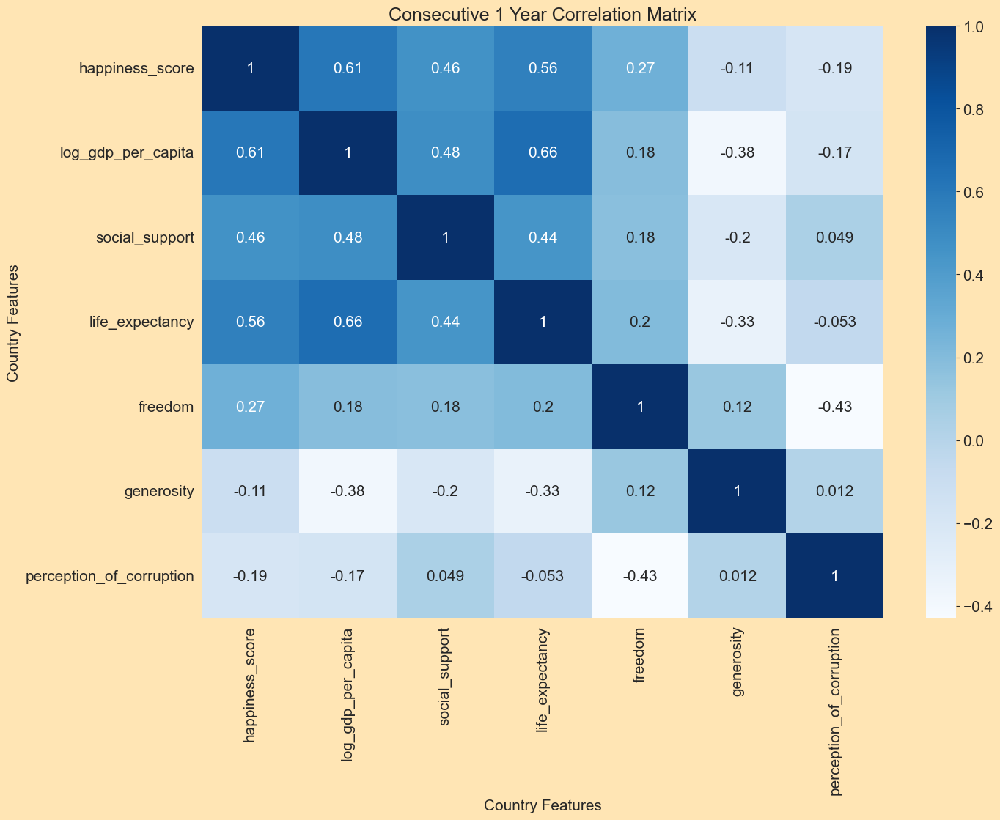

In [112]:
### What country feature correlates with happiness in con_01?

con_01_corr_matrix = con_01.drop(['country_id', 'year'], axis=1).corr(numeric_only = True, method = "pearson")
sns.heatmap(con_01_corr_matrix, annot=True, cmap="Blues")

plt.title('Consecutive 1 Year Correlation Matrix')
plt.xlabel('Country Features')
plt.ylabel('Country Features')

plt.show()

# Shows that Country Features with the highest correlation to happiness are: log_gdp_per_capita, healthy_life_expectancy, and social_support

In [113]:
# Show what correlates to happiness in con_01

con_01_happiness_corr = con_01.corr(numeric_only = True)['happiness_score'].sort_values(ascending=False)
con_01_happiness_corr

happiness_score             1.000000
log_gdp_per_capita          0.605348
life_expectancy             0.563569
social_support              0.458343
freedom                     0.269329
year                        0.076438
generosity                 -0.106733
country_id                 -0.148957
perception_of_corruption   -0.188676
Name: happiness_score, dtype: float64

In [114]:
# Show all positive correlations in con_01

con_01_corr = con_01.corr(numeric_only = True)
con_01_corr_unstack = con_01_corr.unstack().sort_values()
con_01_high_corr = con_01_corr_unstack.sort_values(ascending=False)
con_01_high_corr = con_01_high_corr[(con_01_high_corr < 1) & (con_01_high_corr > 0.5)].drop_duplicates()
con_01_high_corr

log_gdp_per_capita  life_expectancy    0.661175
                    happiness_score    0.605348
life_expectancy     happiness_score    0.563569
dtype: float64

### 2 consecutive years

In [115]:
test_data = data
con_02 = test_data[['country_name', 'year', 'happiness_score']].sort_values(['country_name','year'])

In [116]:
# Find the difference between 2 consecutive years by country

con_02['diff']=con_02.groupby(['country_name',con_02['year'].diff().ne(1).cumsum()])['happiness_score'].diff(2)
con_02_all_diff = con_02[con_02['diff'].isna() == False]

print(con_02.shape)
con_02.head(20)

(2356, 4)


,country_name,year,happiness_score,diff
0,Afghanistan,2008,3.723590,NaN
1,Afghanistan,2009,4.401778,NaN
2,Afghanistan,2010,4.758381,1.034791
3,Afghanistan,2011,3.831719,-0.570059
4,Afghanistan,2012,3.782938,-0.975443
5,Afghanistan,2013,3.572100,-0.259619
6,Afghanistan,2014,3.130896,-0.652042
7,Afghanistan,2015,3.982855,0.410754
8,Afghanistan,2016,4.220169,1.089273
9,Afghanistan,2017,2.661718,-1.321136


In [117]:
con_02['diff'].describe()

count    1760.000000
mean        0.022910
std         0.453627
min        -2.533434
25%        -0.202514
50%         0.024372
75%         0.260190
max         1.865735
Name: diff, dtype: float64

In [118]:
# Mean and Standard Deviation

con_02_mean = 0.022910
con_02_std = 0.453627

# 2 Standard Deviations

print(con_02_std * 2)

0.907254


In [119]:
# show differences that are unusallly large (2 standard deviations away)

con_02_top = con_02[con_02['diff'] > con_02_mean + (con_02_std * 2)].sort_values('diff', ascending=False)

print(con_02_top.shape)
con_02_top.sort_values('diff', ascending=False).head(20)

(48, 4)


,country_name,year,happiness_score,diff
132,Bahrain,2013,6.689711,1.865735
200,Benin,2018,5.819827,1.812469
1198,Liberia,2017,4.424491,1.722900
819,Guinea,2018,5.252227,1.649372
631,El Salvador,2013,6.325063,1.583768
628,El Salvador,2010,6.739911,1.548417
627,El Salvador,2009,6.839087,1.543552
2342,Zimbabwe,2010,4.681570,1.507306
772,Ghana,2017,5.481311,1.495395
766,Ghana,2011,5.608200,1.410504


In [120]:
con_02_top_index = con_02_top.index.tolist()
con_02_top_index.sort()

a = [x-1 for x in con_02_top_index]
b = [x-2 for x in con_02_top_index]

con_02_top_all_index = con_02_top_index + a + b 
con_02_top_all_index = list(set(con_02_top_all_index)) # Removing overlapping Country Year 
con_02_top_all_index.sort()

print(con_02_top_index[:12])
print(con_02_top_all_index[:12])

[2, 8, 77, 132, 133, 199, 200, 246, 297, 371, 454, 500]
[0, 1, 2, 6, 7, 8, 75, 76, 77, 130, 131, 132]


In [121]:
con_02 = data.iloc[con_02_top_all_index]

print(con_02.shape)
con_02.head(20)

(136, 11)


,country_name,country_id,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
0,Afghanistan,1,Asia & Pacific,2008,3.723590,7.350416,0.450662,50.500000,0.718114,0.167652,0.881686
1,Afghanistan,1,Asia & Pacific,2009,4.401778,7.508646,0.552308,50.799999,0.678896,0.190809,0.850035
2,Afghanistan,1,Asia & Pacific,2010,4.758381,7.613900,0.539075,51.099998,0.600127,0.121316,0.706766
6,Afghanistan,1,Asia & Pacific,2014,3.130896,7.670638,0.525568,52.299999,0.508514,0.105755,0.871242
7,Afghanistan,1,Asia & Pacific,2015,3.982855,7.653833,0.528597,52.599998,0.388928,0.081652,0.880638
8,Afghanistan,1,Asia & Pacific,2016,4.220169,7.650370,0.559072,52.924999,0.522566,0.043916,0.793246
75,Armenia,5,Europe,2017,4.287736,9.434255,0.697925,66.550003,0.613697,-0.152285,0.864683
76,Armenia,5,Europe,2018,5.062449,9.490351,0.814449,66.824997,0.807644,-0.168633,0.676826
77,Armenia,5,Europe,2019,5.488087,9.569242,0.781604,67.099998,0.844324,-0.179027,0.583473
130,Bahrain,8,Arab States,2011,4.823976,10.748598,0.907868,65.239998,0.869870,-0.059403,0.582522


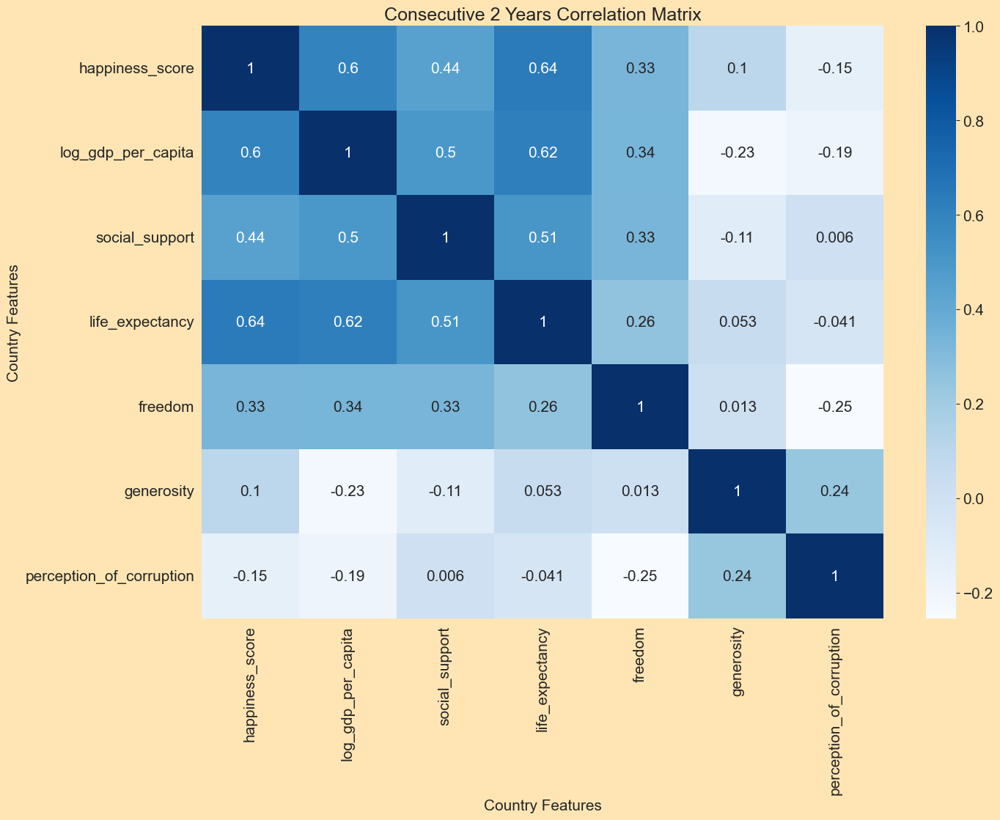

In [122]:
### What country feature correlates with happiness in con_02?

con_02_corr_matrix = con_02.drop((['country_id', 'year']), axis=1).corr(numeric_only = True, method = "pearson")
sns.heatmap(con_02_corr_matrix, annot=True, cmap="Blues")

plt.title('Consecutive 2 Years Correlation Matrix')
plt.xlabel('Country Features')
plt.ylabel('Country Features')

plt.show()

# Shows that Country Features with the highest correlation to happiness are: log_gdp_per_capita, healthy_life_expectancy, and social_support

In [123]:
# Show what correlates to happiness in con_02

con_02_happiness_corr = con_02.corr(numeric_only = True)['happiness_score'].sort_values(ascending=False)
con_02_happiness_corr

happiness_score             1.000000
life_expectancy             0.640779
log_gdp_per_capita          0.599925
social_support              0.441986
freedom                     0.332106
generosity                  0.102097
year                        0.085419
country_id                  0.036208
perception_of_corruption   -0.146824
Name: happiness_score, dtype: float64

In [124]:
# Show all positive correlations in con_02

con_02_corr = con_02.corr(numeric_only = True)
con_02_corr_unstack = con_02_corr.unstack().sort_values()
con_02_high_corr = con_02_corr_unstack.sort_values(ascending=False)
con_02_high_corr = con_02_high_corr[(con_02_high_corr < 1) & (con_02_high_corr > 0.5)].drop_duplicates()
con_02_high_corr

life_expectancy     happiness_score    0.640779
log_gdp_per_capita  life_expectancy    0.618527
                    happiness_score    0.599925
social_support      life_expectancy    0.505480
dtype: float64

#### Create a diagram where the change in happiness by years passed is shown.

In [125]:
# Create a copy of the data to work with
test_data_3 = data[['country_name', 'country_id', 'region', 'year', 'happiness_score']].copy()

In [126]:
test_data_3.sample(10)

,country_name,country_id,region,year,happiness_score
102,Austria,7,Europe,2012,7.400689
926,Indonesia,55,Asia & Pacific,2019,5.346513
663,Ethiopia,39,Africa,2013,4.444827
1816,Serbia,109,Europe,2019,6.241407
178,Belgium,10,Europe,2013,7.103661
796,Guatemala,48,South/Latin America,2006,5.901429
477,Costa Rica,28,South/Latin America,2013,7.158000
1738,Romania,105,Europe,2023,6.589100
781,Greece,47,Europe,2009,6.038575
832,Haiti,149,South/Latin America,2014,3.888778


In [127]:
# Find the difference in happines scores with a 06 year difference

happiness_diff_06 = test_data_3.copy()
happiness_diff_06['year_shift'] = happiness_diff_06['year'] - 6

test_data_4 = test_data_3.copy()[['country_name', 'year', 'happiness_score']].rename(columns={'happiness_score':'happiness_shift'})
merged_df = pd.merge(happiness_diff_06, test_data_4, left_on=['country_name', 'year_shift'], right_on=['country_name', 'year'], how = 'left')

merged_df['happiness_diff'] = merged_df['happiness_score'] - merged_df['happiness_shift']

happiness_diff_06 = merged_df.drop('year_y', axis=1).rename(columns={'year_x':'year'})
happiness_diff_06.head(25)

,country_name,country_id,region,year,happiness_score,year_shift,happiness_shift,happiness_diff
0,Afghanistan,1,Asia & Pacific,2008,3.723590,2002,NaN,NaN
1,Afghanistan,1,Asia & Pacific,2009,4.401778,2003,NaN,NaN
2,Afghanistan,1,Asia & Pacific,2010,4.758381,2004,NaN,NaN
3,Afghanistan,1,Asia & Pacific,2011,3.831719,2005,NaN,NaN
4,Afghanistan,1,Asia & Pacific,2012,3.782938,2006,NaN,NaN
5,Afghanistan,1,Asia & Pacific,2013,3.572100,2007,NaN,NaN
6,Afghanistan,1,Asia & Pacific,2014,3.130896,2008,3.723590,-0.592694
7,Afghanistan,1,Asia & Pacific,2015,3.982855,2009,4.401778,-0.418924
8,Afghanistan,1,Asia & Pacific,2016,4.220169,2010,4.758381,-0.538212
9,Afghanistan,1,Asia & Pacific,2017,2.661718,2011,3.831719,-1.170001


In [128]:
# Describe the initial set up for matching
happiness_diff_06 = happiness_diff_06[happiness_diff_06['happiness_shift'].isna() == False]
happiness_diff_06['happiness_diff'].describe()

count    1395.000000
mean        0.061906
std         0.618201
min        -3.437340
25%        -0.254851
50%         0.045698
75%         0.420628
max         2.626358
Name: happiness_diff, dtype: float64

In [129]:
happiness_diff_list = []

for i in range(1, 19):  # Iterate from 1 to 18 inclusive
    
    # Create a copy of the original DataFrame
    happiness_diff_i = test_data_3.copy()

    # Shift the 'year' column by i years to get the comparison year
    happiness_diff_i['year_shift'] = happiness_diff_i['year'] - i

    # Merge the DataFrame with itself to get the happiness score of the shifted year
    merged_df = pd.merge(happiness_diff_i, test_data_3.copy()[['country_name', 'year', 'happiness_score']].rename(columns={'happiness_score':'happiness_shift'}), 
                         left_on=['country_name', 'year_shift'], right_on=['country_name', 'year'], how='left')
    
    # Calculate the difference in happiness scores
    merged_df['happiness_diff'] = merged_df['happiness_score'] - merged_df['happiness_shift']

    # Filter out rows where the shifted year's happiness score is not available
    happiness_diff_i = merged_df.dropna(subset=['happiness_shift']).drop('year_y', axis=1).rename(columns={'year_x':'year'})

    # Append the filtered DataFrame to the list
    happiness_diff_list.append(happiness_diff_i)

# Concatenate the list of DataFrames into a single DataFrame
happiness_difference = pd.concat(happiness_diff_list, ignore_index=True)

# Calculate the difference in year
happiness_difference['year_diff'] = happiness_difference['year'] - happiness_difference['year_shift']

In [130]:
happiness_difference.describe()

,country_id,year,happiness_score,year_shift,happiness_shift,happiness_diff,year_diff
count,17476.000000,17476.000000,17476.000000,17476.000000,17476.000000,17476.000000,17476.000000
mean,74.016194,2017.651122,5.559515,2011.591554,5.501482,0.058034,6.059567
std,42.989470,4.025568,1.108270,4.090049,1.107598,0.600630,4.025832
min,1.000000,2006.000000,1.281271,2005.000000,1.281271,-3.477110,1.000000
25%,36.000000,2015.000000,4.769740,2008.000000,4.668812,-0.244789,3.000000
50%,73.000000,2018.000000,5.611394,2011.000000,5.384702,0.053630,5.000000
75%,110.000000,2021.000000,6.365509,2015.000000,6.331491,0.396114,9.000000
max,165.000000,2023.000000,7.970892,2022.000000,8.018934,2.626358,18.000000


In [131]:
# Matches with initial set up
happiness_difference[happiness_difference['year_diff'] == 6]['happiness_diff'].describe()

count    1395.000000
mean        0.061906
std         0.618201
min        -3.437340
25%        -0.254851
50%         0.045698
75%         0.420628
max         2.626358
Name: happiness_diff, dtype: float64

In [132]:
happiness_difference.groupby('year_diff')['happiness_diff'].mean().reset_index().rename(columns={'happiness_diff':'avg_happiness_diff'})

,year_diff,avg_happiness_diff
0,1,0.011251
1,2,0.028191
2,3,0.025271
3,4,0.032771
4,5,0.049756
5,6,0.061906
6,7,0.079788
7,8,0.089779
8,9,0.094395
9,10,0.098914


In [133]:
# There is no strong correlation between year difference and happiness difference

happiness_difference[['year_diff', 'happiness_diff']].corr()

,year_diff,happiness_diff
year_diff,1.000000,0.052501
happiness_diff,0.052501,1.000000


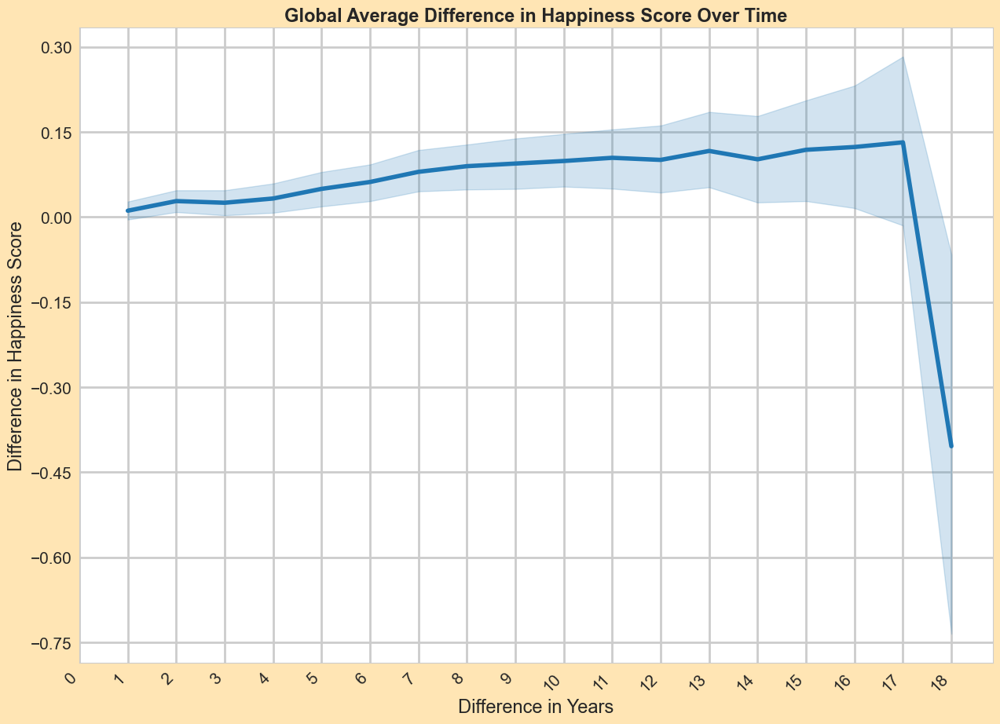

In [134]:
# Plot global difference using a lineplot

ax = sns.lineplot(data = happiness_difference, x='year_diff',y='happiness_diff', linewidth=4.0)

ax.set_title('Global Average Difference in Happiness Score Over Time', fontweight="bold", size=17)
ax.set_xlabel('Difference in Years', size=17)
ax.set_ylabel('Difference in Happiness Score', size=17)
ax.tick_params(labelsize=15)
ax.yaxis.set_major_locator(MaxNLocator(nbins=10))
ax.set_xticks(range(19))
ax.set_xticklabels(range(19), rotation=45, horizontalalignment='right')
ax.grid(linewidth=2)

plt.show()

In [135]:
legend

['Europe',
 'Africa',
 'Asia & Pacific',
 'South/Latin America',
 'Middle east',
 'Arab States',
 'North America',
 'South/Central America']

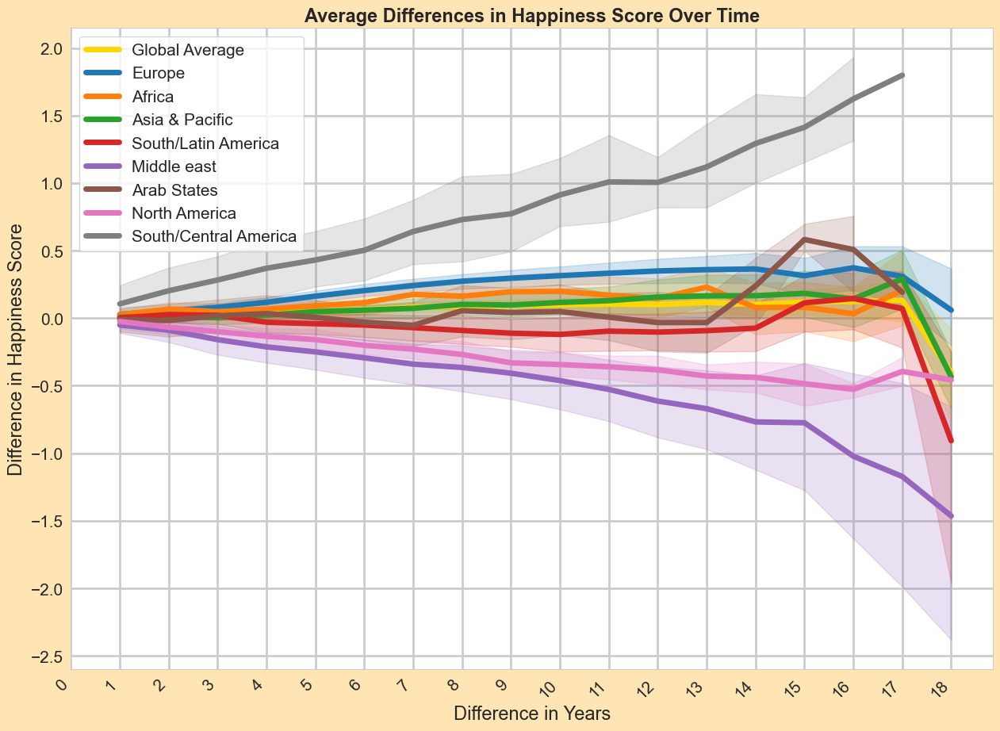

In [136]:
# Plot regional difference using a lineplot

ax = sns.lineplot(data = happiness_difference, x='year_diff',y='happiness_diff', linewidth=5.0, color='gold', label='Global Average')

for region in legend:
    region_data = happiness_difference[happiness_difference['region'] == region]
    sns.lineplot(data=region_data, x='year_diff', y='happiness_diff', linewidth=5.0, label=region)

ax.set_title('Average Differences in Happiness Score Over Time', fontweight="bold", size=17)
ax.set_xlabel('Difference in Years', size=17)
ax.set_ylabel('Difference in Happiness Score', size=17)
ax.legend(loc='upper left')
ax.tick_params(labelsize=15)
ax.yaxis.set_major_locator(MaxNLocator(nbins=10))
ax.set_xticks(range(19))
ax.set_xticklabels(range(19), rotation=45, horizontalalignment='right')
ax.grid(linewidth=2)

plt.show()

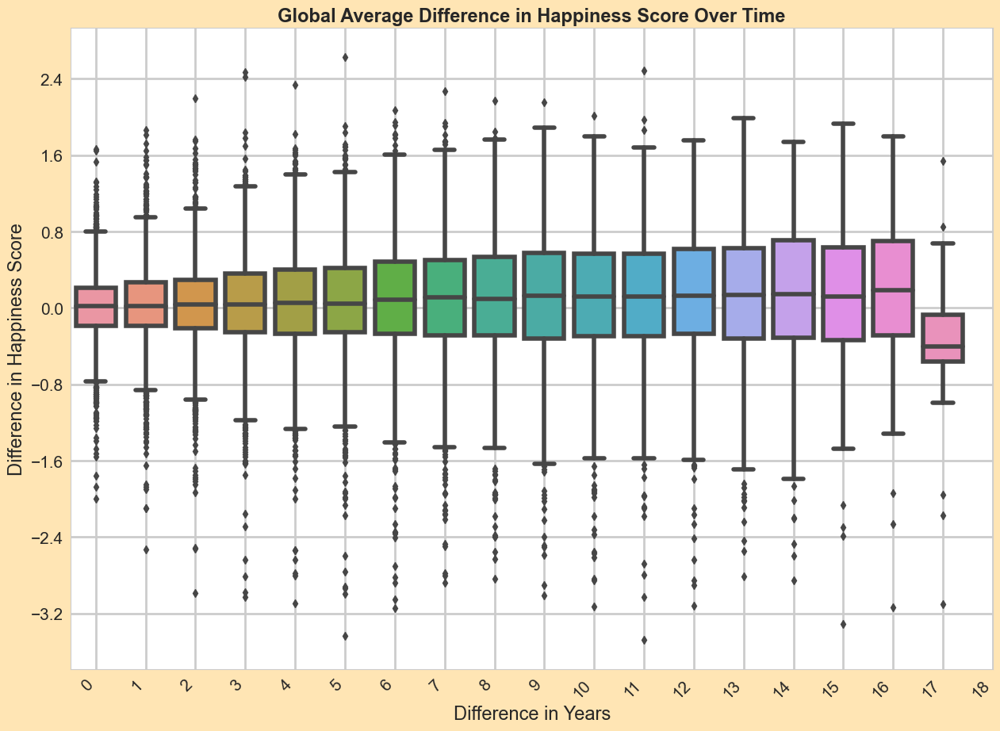

In [137]:
# Plot global difference using a boxplot
# error in x axis

ax = sns.boxplot(data = happiness_difference, x='year_diff',y='happiness_diff', linewidth=4.0)

ax.set_title('Global Average Difference in Happiness Score Over Time', fontweight="bold", size=17)
ax.set_xlabel('Difference in Years', size=17)
ax.set_ylabel('Difference in Happiness Score', size=17)
ax.tick_params(labelsize=15)
ax.yaxis.set_major_locator(MaxNLocator(nbins=10))
ax.set_xticks(range(19))
ax.set_xticklabels(range(19), rotation=45, horizontalalignment='right')
ax.grid(linewidth=2)

plt.show()

ValueError: The number of FixedLocator locations (18), usually from a call to set_ticks, does not match the number of labels (19).

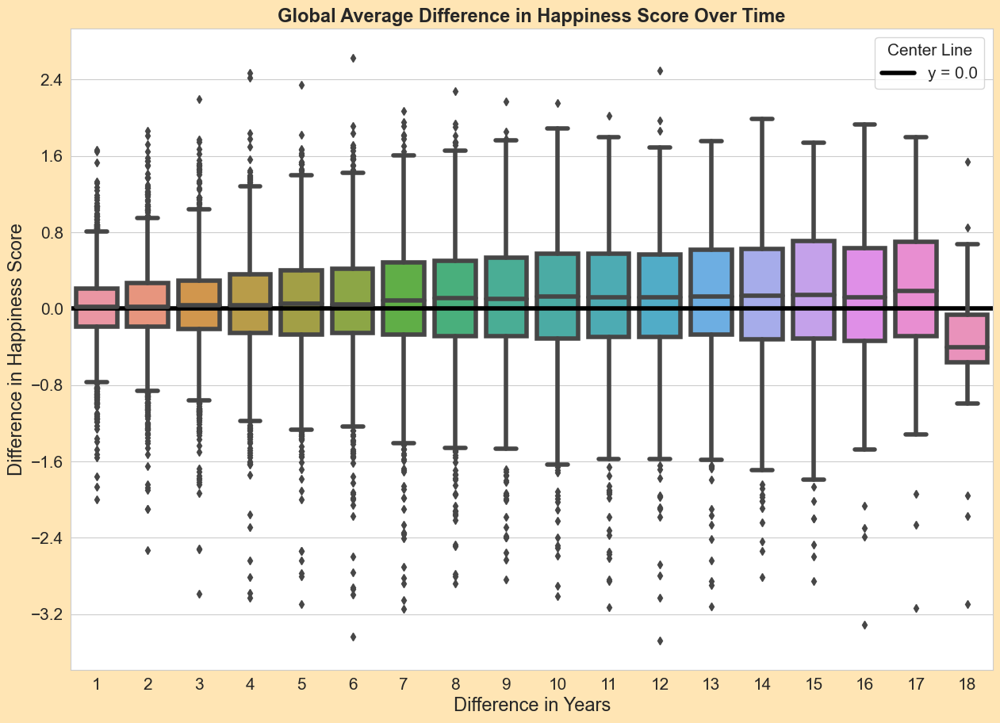

In [138]:
# Plot global difference using a lineplot
# error in x axis fixed visually 
ax = plt.axhline(y=0, color='black', linestyle='-', linewidth=4, alpha=1, label ='y = 0.0')
ax = sns.boxplot(data = happiness_difference, x='year_diff',y='happiness_diff', linewidth=4.0)

ax.set_title('Global Average Difference in Happiness Score Over Time', fontweight="bold", size=17)
ax.set_xlabel('Difference in Years', size=17)
ax.set_ylabel('Difference in Happiness Score', size=17)
ax.legend(title='Center Line')
ax.tick_params(labelsize=15)
ax.yaxis.set_major_locator(MaxNLocator(nbins=10))
ax.set_xticklabels(range(19), rotation=45, horizontalalignment='right')
ax.grid(linewidth=2)

plt.show()

In [139]:
happiness_difference.head(20)

,country_name,country_id,region,year,happiness_score,year_shift,happiness_shift,happiness_diff,year_diff
0,Afghanistan,1,Asia & Pacific,2009,4.401778,2008,3.723590,0.678188,1
1,Afghanistan,1,Asia & Pacific,2010,4.758381,2009,4.401778,0.356603,1
2,Afghanistan,1,Asia & Pacific,2011,3.831719,2010,4.758381,-0.926662,1
3,Afghanistan,1,Asia & Pacific,2012,3.782938,2011,3.831719,-0.048782,1
4,Afghanistan,1,Asia & Pacific,2013,3.572100,2012,3.782938,-0.210837,1
5,Afghanistan,1,Asia & Pacific,2014,3.130896,2013,3.572100,-0.441205,1
6,Afghanistan,1,Asia & Pacific,2015,3.982855,2014,3.130896,0.851959,1
7,Afghanistan,1,Asia & Pacific,2016,4.220169,2015,3.982855,0.237314,1
8,Afghanistan,1,Asia & Pacific,2017,2.661718,2016,4.220169,-1.558450,1
9,Afghanistan,1,Asia & Pacific,2018,2.694303,2017,2.661718,0.032585,1


In [140]:
test_data_4 = data.copy()
test_data_4.head(10)

,country_name,country_id,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
0,Afghanistan,1,Asia & Pacific,2008,3.723590,7.350416,0.450662,50.500000,0.718114,0.167652,0.881686
1,Afghanistan,1,Asia & Pacific,2009,4.401778,7.508646,0.552308,50.799999,0.678896,0.190809,0.850035
2,Afghanistan,1,Asia & Pacific,2010,4.758381,7.613900,0.539075,51.099998,0.600127,0.121316,0.706766
3,Afghanistan,1,Asia & Pacific,2011,3.831719,7.581259,0.521104,51.400002,0.495901,0.163571,0.731109
4,Afghanistan,1,Asia & Pacific,2012,3.782938,7.660506,0.520637,51.700001,0.530935,0.237588,0.775620
5,Afghanistan,1,Asia & Pacific,2013,3.572100,7.680333,0.483552,52.000000,0.577955,0.062666,0.823204
6,Afghanistan,1,Asia & Pacific,2014,3.130896,7.670638,0.525568,52.299999,0.508514,0.105755,0.871242
7,Afghanistan,1,Asia & Pacific,2015,3.982855,7.653833,0.528597,52.599998,0.388928,0.081652,0.880638
8,Afghanistan,1,Asia & Pacific,2016,4.220169,7.650370,0.559072,52.924999,0.522566,0.043916,0.793246
9,Afghanistan,1,Asia & Pacific,2017,2.661718,7.647830,0.490880,53.250000,0.427011,-0.119410,0.954393


In [141]:
merged_df = pd.merge(happiness_difference, test_data_4, how='left', on=('country_name', 'year'))
merged_df.head(10)

,country_name,country_id_x,region_x,year,happiness_score_x,year_shift,happiness_shift,happiness_diff,year_diff,country_id_y,region_y,happiness_score_y,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
0,Afghanistan,1,Asia & Pacific,2009,4.401778,2008,3.723590,0.678188,1,1,Asia & Pacific,4.401778,7.508646,0.552308,50.799999,0.678896,0.190809,0.850035
1,Afghanistan,1,Asia & Pacific,2010,4.758381,2009,4.401778,0.356603,1,1,Asia & Pacific,4.758381,7.613900,0.539075,51.099998,0.600127,0.121316,0.706766
2,Afghanistan,1,Asia & Pacific,2011,3.831719,2010,4.758381,-0.926662,1,1,Asia & Pacific,3.831719,7.581259,0.521104,51.400002,0.495901,0.163571,0.731109
3,Afghanistan,1,Asia & Pacific,2012,3.782938,2011,3.831719,-0.048782,1,1,Asia & Pacific,3.782938,7.660506,0.520637,51.700001,0.530935,0.237588,0.775620
4,Afghanistan,1,Asia & Pacific,2013,3.572100,2012,3.782938,-0.210837,1,1,Asia & Pacific,3.572100,7.680333,0.483552,52.000000,0.577955,0.062666,0.823204
5,Afghanistan,1,Asia & Pacific,2014,3.130896,2013,3.572100,-0.441205,1,1,Asia & Pacific,3.130896,7.670638,0.525568,52.299999,0.508514,0.105755,0.871242
6,Afghanistan,1,Asia & Pacific,2015,3.982855,2014,3.130896,0.851959,1,1,Asia & Pacific,3.982855,7.653833,0.528597,52.599998,0.388928,0.081652,0.880638
7,Afghanistan,1,Asia & Pacific,2016,4.220169,2015,3.982855,0.237314,1,1,Asia & Pacific,4.220169,7.650370,0.559072,52.924999,0.522566,0.043916,0.793246
8,Afghanistan,1,Asia & Pacific,2017,2.661718,2016,4.220169,-1.558450,1,1,Asia & Pacific,2.661718,7.647830,0.490880,53.250000,0.427011,-0.119410,0.954393
9,Afghanistan,1,Asia & Pacific,2018,2.694303,2017,2.661718,0.032585,1,1,Asia & Pacific,2.694303,7.630801,0.507516,53.575001,0.373536,-0.091106,0.927606


In [142]:
diff_corr = merged_df[['happiness_score_x', 'year_diff', 'log_gdp_per_capita',  'social_support',  'life_expectancy',  'freedom',  'generosity',  'perception_of_corruption']].rename(columns={'happiness_score_x':'happiness_score'})
diff_corr.head(10)

,happiness_score,year_diff,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
0,4.401778,1,7.508646,0.552308,50.799999,0.678896,0.190809,0.850035
1,4.758381,1,7.613900,0.539075,51.099998,0.600127,0.121316,0.706766
2,3.831719,1,7.581259,0.521104,51.400002,0.495901,0.163571,0.731109
3,3.782938,1,7.660506,0.520637,51.700001,0.530935,0.237588,0.775620
4,3.572100,1,7.680333,0.483552,52.000000,0.577955,0.062666,0.823204
5,3.130896,1,7.670638,0.525568,52.299999,0.508514,0.105755,0.871242
6,3.982855,1,7.653833,0.528597,52.599998,0.388928,0.081652,0.880638
7,4.220169,1,7.650370,0.559072,52.924999,0.522566,0.043916,0.793246
8,2.661718,1,7.647830,0.490880,53.250000,0.427011,-0.119410,0.954393
9,2.694303,1,7.630801,0.507516,53.575001,0.373536,-0.091106,0.927606


In [143]:
diff_1_corr = diff_corr[diff_corr['year_diff'] == 1].corr()['happiness_score'].drop('year_diff', axis=0)
diff_1_corr = pd.DataFrame(diff_1_corr)
diff_1_corr

,happiness_score
happiness_score,1.000000
log_gdp_per_capita,0.777453
social_support,0.694419
life_expectancy,0.683493
freedom,0.421855
generosity,0.168788
perception_of_corruption,-0.120376


In [144]:
diff_1_corr = diff_1_corr.transpose().reset_index().drop(['index', 'happiness_score'], axis=1)
diff_1_corr['diff_year'] = 1
diff_1_corr

,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption,diff_year
0,0.777453,0.694419,0.683493,0.421855,0.168788,-0.120376,1


In [145]:
#loop 1 to 18 inclusive

diff_corr_list = []

for i in range(1, 19):
        
    diff_i_corr = diff_corr[diff_corr['year_diff'] == i].corr()['happiness_score'].drop('year_diff', axis=0)
    diff_i_corr = pd.DataFrame(diff_i_corr)
    diff_i_corr = diff_i_corr.transpose().reset_index().drop(['index', 'happiness_score'], axis=1)
    diff_i_corr['diff_year'] = i

    diff_corr_list.append(diff_i_corr)

diff_corr_all = pd.concat(diff_corr_list, ignore_index=True)


In [146]:
diff_corr_all

,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption,diff_year
0,0.777453,0.694419,0.683493,0.421855,0.168788,-0.120376,1
1,0.775786,0.722891,0.675627,0.460459,0.164434,-0.169749,2
2,0.776554,0.728596,0.681106,0.525029,0.159055,-0.263422,3
3,0.776744,0.734843,0.682027,0.529472,0.137973,-0.435285,4
4,0.779331,0.738875,0.685430,0.536313,0.142246,-0.433626,5
5,0.782633,0.747685,0.691739,0.548878,0.130126,-0.441077,6
6,0.778201,0.748754,0.691746,0.540792,0.125295,-0.442885,7
7,0.777526,0.762827,0.690728,0.552117,0.115197,-0.449550,8
8,0.770953,0.775450,0.686898,0.544579,0.107806,-0.448590,9
9,0.768722,0.780668,0.683160,0.547808,0.090717,-0.438317,10


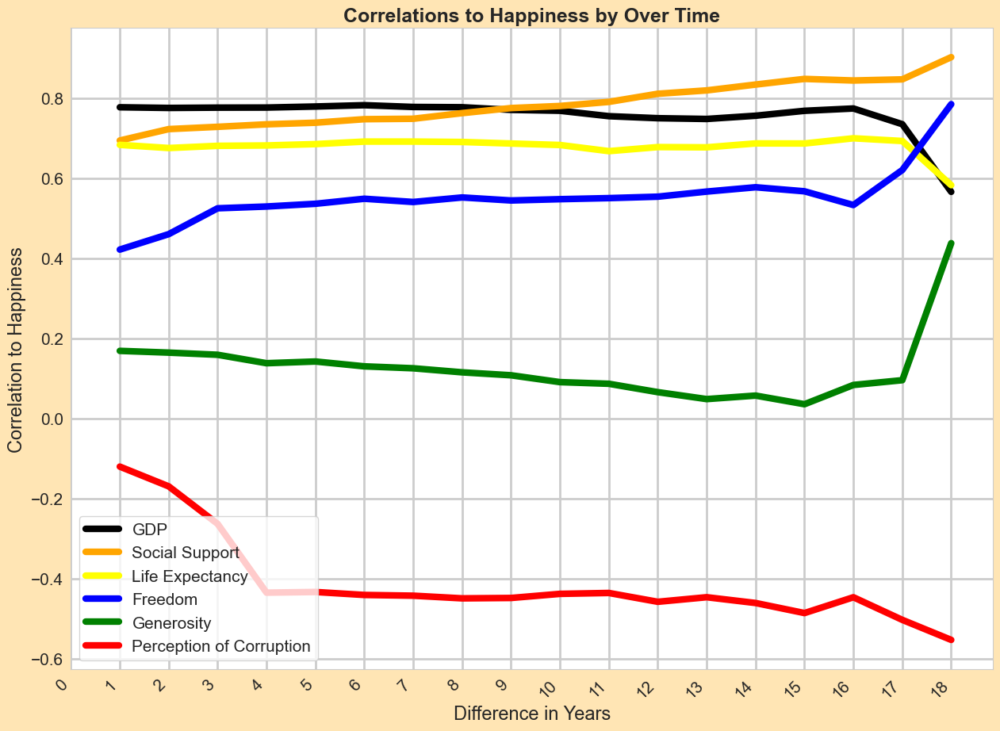

In [147]:
ax = sns.lineplot(data=diff_corr_all, x='diff_year',y='log_gdp_per_capita', linewidth=6.0, color='black', label='GDP')
ax = sns.lineplot(data=diff_corr_all, x='diff_year',y='social_support', linewidth=6.0, color='orange', label='Social Support')
ax = sns.lineplot(data=diff_corr_all, x='diff_year',y='life_expectancy', linewidth=6.0, color='yellow', label='Life Expectancy')
ax = sns.lineplot(data=diff_corr_all, x='diff_year',y='freedom', linewidth=6.0, color='blue', label='Freedom')
ax = sns.lineplot(data=diff_corr_all, x='diff_year',y='generosity', linewidth=6.0, color='green', label='Generosity')
ax = sns.lineplot(data=diff_corr_all, x='diff_year',y='perception_of_corruption', linewidth=6.0, color='red', label='Perception of Corruption')

ax.set_title('Correlations to Happiness by Over Time',fontweight="bold")
ax.set_xlabel('Difference in Years', size=17)
ax.set_ylabel('Correlation to Happiness', size=17)
ax.legend(loc='lower left')
ax.tick_params(labelsize=15)
ax.set_xticks(range(19))
ax.set_xticklabels(range(19), rotation=45, horizontalalignment='right')
ax.grid(linewidth=2)

plt.show()